In [42]:
from sklearn.cluster import KMeans
import numpy as np
import h5py
import csv
import math
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from matplotlib import style
from scipy.ndimage import gaussian_filter
from scipy.ndimage import gaussian_filter1d
from scipy.signal import savgol_filter
from mpl_toolkits.axes_grid1 import make_axes_locatable

from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import scipy.stats as stats
#import umap
#import umap.umap_ as umap
import pandas as pd
import seaborn as sns
import copy
from scipy.stats import ranksums
from scipy.stats import ks_2samp
import warnings
from scipy.signal import find_peaks
import scipy
# Suppress all warnings
warnings.filterwarnings("ignore")
# Suppress specific warning (e.g., UserWarning)
warnings.filterwarnings("ignore", category=UserWarning)
from sklearn.mixture import GaussianMixture
import importlib
import Functions.AllFunctions as AllF
import Functions.Distributions_functions as DF
import Functions.Binning as Bin

In [67]:
h5 = h5py.File('MegaData7_7worms_V3.h5', 'r')

In [68]:
Directory = '/mnt/DATA/Mahsa/movies/LongRecordings/codes/Data_3_worms/'
Directoryh5 = Directory + 'neu_activity/NewNeurites/'
neur_addr6 = Directoryh5+'SJR16_0917_Activity0.h5'
h_activity6 = h5py.File(neur_addr6,'r')
h_activity6gr = h5py.File(neur_addr6,'r')
GreenActivity_devided6 = np.array(h_activity6['Mean_10perc/Green'])
GreenActivity6 = np.array(h_activity6['Mean/Green'])
real_time6 = np.array(h_activity6["Real_time_series"])
GreenActivity6stack = np.array(h_activity6gr['Mean/Green'])

In [5]:
MegaData[5,:L[5],2] = ((AllF.droptop5perc(AllF.dropbottom5perc(GreenActivity_devided6[4,:],0.005),0.005)))#convert_properly(rowsArr_float6[:,2])#RIM
MegaData[5,:L[5],3] = ((AllF.droptop5perc(AllF.dropbottom5perc(GreenActivity_devided6[6,:],0.005),0.005)))#convert_properly(rowsArr_float6[:,3])#RIM
MegaData[5,:L[5],4] = ((AllF.droptop5perc(AllF.dropbottom5perc(GreenActivity_devided6[3,:],0.005),0.005)))#convert_properly(rowsArr_float6[:,4])#RIB
MegaData[5,:L[5],5] = ((AllF.droptop5perc(AllF.dropbottom5perc(GreenActivity_devided6[7,:],0.005),0.005)))

NameError: name 'droptop5perc' is not defined

In [69]:
L= h5['data_sets_info/lowercam_length']
n_title = [s.decode('utf-8') for s in list(h5['data_sets_info/neuron_names'])]
MegaData0 = np.copy(h5['data/dataraw'])
MegaData =copy.deepcopy(MegaData0)
smooth=True

#the upper camera in the  6th movie starts late
for i in range(55):
    if i >12 and not (i in [27,28,39,40]):
        MegaData[5,:243,i] = 0
        MegaData0[5,:243,i] = 0

In [70]:
sm = [2,2,2,3,4,3]
g=[5,5,5,7,10,7]
if smooth:
    for d in range(6):
        for i in range(55):
            if not (i in [10,11,12]):
                MegaData[d,:L[d],i] = AllF.smooth_vec_long(MegaData0[d,:L[d],i],sm[d],g[d])

In [71]:
#intervals of IAA and nonanone
IAA_int = np.zeros((7,4))
NN_int = np.zeros((7,4))
IAA_int[0,:] = [210,690,1775,2255]
IAA_int[1,:] = [210,690,1775,2255]
IAA_int[2,:] = [210,690,1775,2255]
IAA_int[3,:] = [210,690,1775,2255]
IAA_int[4,:] = [1,500,1575,2055]
NN_int[0,:] = [997,1477,2555,3040]
NN_int[1,:] = [997,1477,2555,3040]
NN_int[2,:] = [997,1477,2555,3040]
NN_int[3,:] = [997,1477,2555,3040]
NN_int[4,:] = [797,1277,2350,2840]
NN_int[5,:] = [957,1437,2520,3000]
IAA_int[5,:] = [177,657,1737,2240]
NN_int[6,:] = [1080,1560,2560,3000]
IAA_int[6,:] = [300,780,1780,2260]
# change the odor labels
for d in range(7):
    nn1 = np.nonzero((MegaData0[d,:L[d],12]>950) & (MegaData0[d,:L[d],12]< 1550))
    for t in nn1[0]:
        if MegaData0[d,t,10]:
            MegaData0[d,t,10]=2
    nn1 = np.nonzero(MegaData0[d,:L[d],12]>2300)
    for t in nn1[0]:
        if MegaData0[d,t,10]:
            MegaData0[d,t,10]=2

In [11]:
for d in range(6):
    sec0 = AllF.closest_index(MegaData0[d,:,12],2)
    sec60 = AllF.closest_index(MegaData0[d,:,12],42)
    interval = int(sec60-sec0)
    for t in range(interval,L[d]):
        if MegaData0[d,t,12]>IAA_int[d,0] and MegaData0[d,t,12]<IAA_int[d,1]:
            if (1 in np.unique(MegaData0[d,(t-interval):t,10])) and MegaData0[d,t,10]==0:
                MegaData[d,t,10]=-1
        elif MegaData0[d,t,12]>IAA_int[d,2] and MegaData0[d,t,12]<IAA_int[d,3]:
            if (1 in np.unique(MegaData0[d,(t-interval):t,10])) and MegaData0[d,t,10]==0:
                MegaData[d,t,10]=-1  
        elif MegaData0[d,t,12]>NN_int[d,0] and MegaData0[d,t,12]<NN_int[d,1]:
            if (2 in np.unique(MegaData0[d,(t-interval):t,10])) and MegaData0[d,t,10]==0:
                MegaData[d,t,10]=-2  
        elif MegaData0[d,t,12]>NN_int[d,2] and MegaData0[d,t,12]<NN_int[d,3]:
            if (2 in np.unique(MegaData0[d,(t-interval):t,10])) and MegaData0[d,t,10]==0:
                MegaData[d,t,10]=-2

9.38807536150758
31.647697442227358
72.31185230456421
87.36616725800006
260.23319159277366
69.89305035080004
91.7980637013007


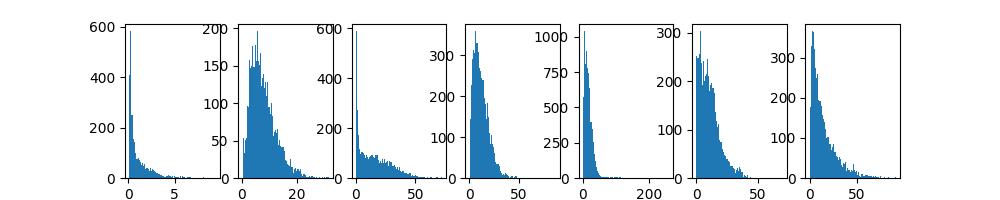

In [14]:
%matplotlib widget
titles = ['veloc','speed','speed3','speed5','speed10']
fig,ax = plt.subplots(1,7,figsize=(10,2))

velchoice=15
if True:
    for d in range(7):
        rowsArr_float = MegaData[d,:L[d],:]
        rowsArr_float[np.isnan(rowsArr_float[:,velchoice]),velchoice]=0
        nonz1  = np.nonzero(rowsArr_float[:,velchoice])
        ax[d].hist(rowsArr_float[nonz1[0],velchoice],bins=80)
        print(np.max(rowsArr_float[nonz1[0],velchoice]))
plt.show()

***********d:   1
p25: -2.949791334046631
p75: 1.612726795301005
***********d:   2
p25: -1.9237937733113577
p75: 5.648545647135165
***********d:   3
p25: -2.5571733514966017
p75: 5.081009921637033
***********d:   4
p25: -4.901160845382101
p75: 6.630531049472733
***********d:   5
p25: -4.397991844338304
p75: 2.3554200111369097
***********d:   6
p25: -7.912791616955783
p75: 11.105167884754229


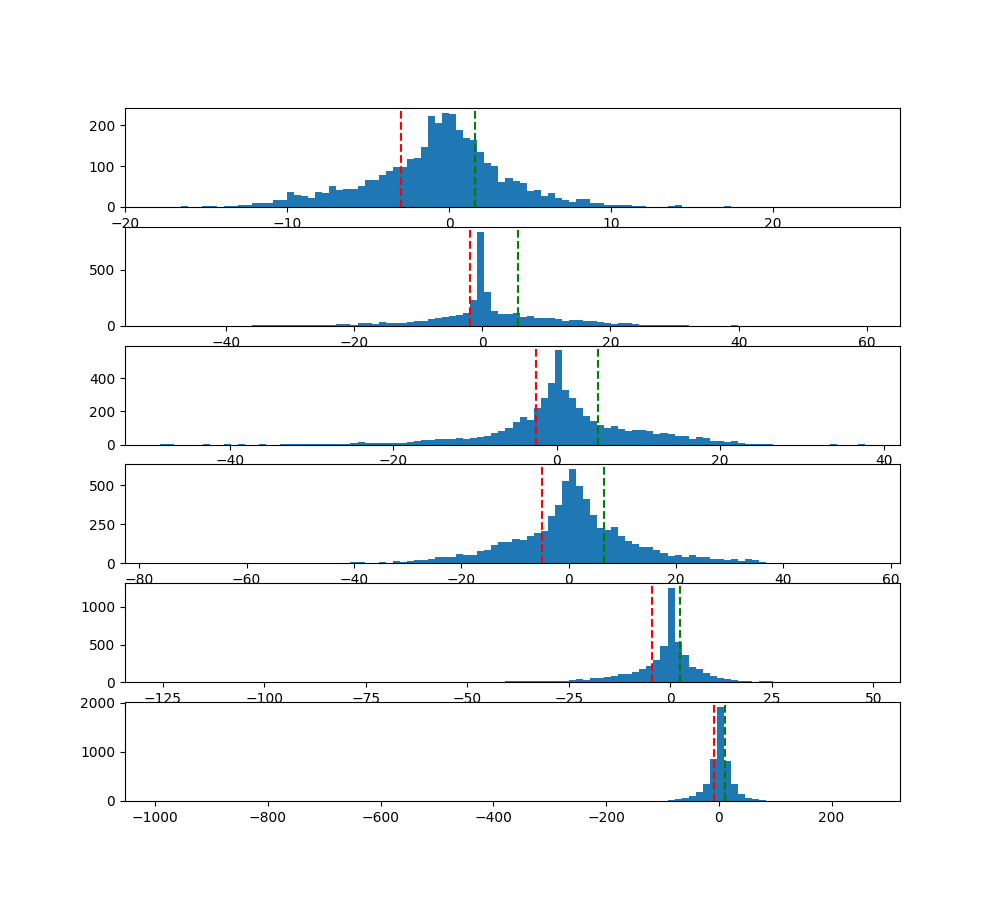

In [17]:
%matplotlib widget
fig,ax = plt.subplots(6,1,figsize=(10,9))

velchoice=22
if True:
    for d in [1,2,3,4,5,6]:
        print("***********d:   "+str(d))
        rowsArr_float = MegaData[d,:L[d],:]
        rowsArr_float[np.isnan(rowsArr_float[:,velchoice]),velchoice]=0
        nonz1  = np.nonzero(rowsArr_float[:,velchoice])
        p25 = np.percentile(rowsArr_float[nonz1[0],velchoice], 25)
        p75 = np.percentile(rowsArr_float[nonz1[0],velchoice], 75)
        ax[d-1].hist(rowsArr_float[nonz1[0],velchoice],bins=100)
        ax[d-1].axvline(p25, color='red', linestyle='--', linewidth=1.5)#, label='25th Percentile')
        ax[d-1].axvline(p75, color='green', linestyle='--', linewidth=1.5)#, label='75th Percentile')
        print("p25: "+str(p25))
        print("p75: "+str(p75))
plt.show()

In [22]:
importlib.reload(AllF)

<module 'Functions.AllFunctions' from '/mnt/DATA/Mahsa/movies/LongRecordings/codes/Cluster/Functions/AllFunctions.py'>

In [23]:
# define different configurations of RIB/RIM or two different RIM/RIBs
RIBsumRIM0 = np.zeros((8,8100,4))
RIBminRIM0 = np.zeros((8,8100,4))
RIBsums0 = np.zeros((8,8100,1))
RIMsums0 = np.zeros((8,8100,1))
RIBsub0 = np.zeros((8,8100,1))
RIMsub0 = np.zeros((8,8100,1))
Interneuron_Binary = np.zeros((6,8100,6))

for d in range(7):
    RIBsumRIM0[d,:,0] =  AllF.compute_vector_z_score(MegaData[d,:,2])+AllF.compute_vector_z_score(MegaData[d,:,4])
    RIBsumRIM0[d,:,1] =  AllF.compute_vector_z_score(MegaData[d,:,2])+AllF.compute_vector_z_score(MegaData[d,:,5])
    RIBsumRIM0[d,:,2] =  AllF.compute_vector_z_score(MegaData[d,:,3])+AllF.compute_vector_z_score(MegaData[d,:,4])
    RIBsumRIM0[d,:,3] =  AllF.compute_vector_z_score(MegaData[d,:,3])+AllF.compute_vector_z_score(MegaData[d,:,5])

    RIBminRIM0[d,:,0] =  AllF.compute_vector_z_score(MegaData[d,:,2])-AllF.compute_vector_z_score(MegaData[d,:,4])
    RIBminRIM0[d,:,1] =  AllF.compute_vector_z_score(MegaData[d,:,2])-AllF.compute_vector_z_score(MegaData[d,:,5])
    RIBminRIM0[d,:,2] =  AllF.compute_vector_z_score(MegaData[d,:,3])-AllF.compute_vector_z_score(MegaData[d,:,4])
    RIBminRIM0[d,:,3] =  AllF.compute_vector_z_score(MegaData[d,:,3])-AllF.compute_vector_z_score(MegaData[d,:,5])

    RIBsums0[d,:,0] = AllF.compute_vector_z_score(MegaData[d,:,4])+AllF.compute_vector_z_score(MegaData[d,:,5])
    RIMsums0[d,:,0] = AllF.compute_vector_z_score(MegaData[d,:,2])+AllF.compute_vector_z_score(MegaData[d,:,3])
    RIBsub0[d,:,0] = AllF.compute_vector_z_score(MegaData[d,:,4])-AllF.compute_vector_z_score(MegaData[d,:,5])
    RIMsub0[d,:,0] = AllF.compute_vector_z_score(MegaData[d,:,2])-AllF.compute_vector_z_score(MegaData[d,:,3])

print(np.shape(MegaData))
MegaData = np.concatenate((MegaData[:,:,:60],RIBsumRIM0), axis=2)
MegaData = np.concatenate((MegaData[:,:,:],RIBminRIM0), axis=2)
MegaData = np.concatenate((MegaData[:,:,:],RIBsums0), axis=2)
MegaData = np.concatenate((MegaData[:,:,:],RIMsums0), axis=2)
MegaData = np.concatenate((MegaData[:,:,:],RIBsub0), axis=2)
MegaData = np.concatenate((MegaData[:,:,:],RIMsub0), axis=2)
print(np.shape(MegaData))
V0=37
for d in range(7):
    print("d:"+str(d))
    print(AllF.compute_row_correlation(MegaData[d,:1000,:], 37, [60]))
print(AllF.compute_row_correlation(MegaData[3,:1000,:], 37, [64]))

(8, 8100, 72)
(8, 8100, 72)
d:0
(array([0.35522424]), array([0.35522424]))
d:1
(array([0.36194501]), array([0.36194501]))
d:2
(array([-0.50638549]), array([-0.50638549]))
d:3
(array([0.02451125]), array([0.02451125]))
d:4
(array([0.0003685]), array([0.0003685]))
d:5
(array([-0.3665589]), array([-0.3665589]))
d:6
(array([0.32266134]), array([0.32266134]))
(array([-0.45081733]), array([-0.45081733]))


In [24]:
V0=15

start = 000
for d in range(1,6):
    end=L[d]
    print('d: '+str(d))
    print('RIMsub: '+str(np.max(AllF.compute_row_correlation(MegaData[d,start:end,:], V0, [71]))))
    print('RIBsub: '+str(np.max(AllF.compute_row_correlation(MegaData[d,start:end,:], V0, [70]))))
    print('RIMsums: '+str(np.max(AllF.compute_row_correlation(MegaData[d,start:end,:], V0, [69]))))
    print('RIBsums: '+str(np.max(AllF.compute_row_correlation(MegaData[d,start:end,:], V0, [68]))))
    
    print('RIBsumRIM: '+str(np.max(AllF.compute_row_correlation(MegaData[d,start:end,:], V0, [60,61,62,63]))))
    print('RIBminRIM: '+str(np.max(AllF.compute_row_correlation(MegaData[d,start:end,:], V0, [64,65,66,67]))))

d: 1
RIMsub: -0.021382281907649157
RIBsub: 0.0017027923628566526
RIMsums: 0.23472286142817164
RIBsums: 0.2602800843996863
RIBsumRIM: 0.2965253683111068
RIBminRIM: -0.020457037174358567
d: 2
RIMsub: 0.21488599141442205
RIBsub: -0.013725274802269706
RIMsums: 0.4869939501401703
RIBsums: 0.22422114073658334
RIBsumRIM: 0.47944663553994077
RIBminRIM: 0.2400299820736449
d: 3
RIMsub: -0.028941328520700617
RIBsub: -0.09944041506412479
RIMsums: -0.04623509626077823
RIBsums: 0.3044653597753919
RIBsumRIM: 0.19743086024402157
RIBminRIM: -0.23166117916292792
d: 4
RIMsub: -0.06771725918883381
RIBsub: -0.045501219034435034
RIMsums: 0.13896086639111668
RIBsums: 0.35680496524488453
RIBsumRIM: 0.37613957891551647
RIBminRIM: -0.11770001568353733
d: 5
RIMsub: -0.05905049890001279
RIBsub: 0.06056249348611626
RIMsums: 0.2893405552137314
RIBsums: 0.4563584863189634
RIBsumRIM: 0.49942500596439515
RIBminRIM: -0.089862618728821


# order of saved data in MegaData file:


0 RIA,1 RIA,2 RIM,3 RIM,4 RIB,5 RIB,6 sensory,7 nrD1 ,8 loop1, 9 neuron or neurite sum,

10 odor,11uppercamera_index,12lower_camera_time_stamp,13v_center_long,

14v_center_signed_long,15v_center_medium,16v_center_signed_medium,17v_center_short,18v_center_signed_short,
19v_head_long,20v_tail,

21: v_headsigned_short, 22 v_headsigned_medium, 23 v_headsigned_long, 24 v_head_short,25 v_head_medium, 26:head curvature,
27: mid-neurite, 28: mid-neurite,

29:head perpandicular_short, 30:head perpandicular_medium, 31:head perpandicular_long, 32:tail velocity perpendicular long, 33:tail velocity_medium, 34:tail velocity_short, 35: tail curvature, 36: merged neurites, 37:component of head vector perpandicular to the center vector. 38: component of a head vector parpendicular to the neck vector,39:nrV1,40:nrV2, 41,42,43:v_centermean_signed/7/15 computed differently. 44:bad frames in the upper camera. 45/46/47: mid body angular velocity theta short/medium/long

# Sliding Correlations

In [52]:
V0=46
d=1
V1,V2 = AllF.compute_row_correlation_sliding(MegaData[d,:L[d],:],MegaData[d,:L[d],:], V0, [60,61,62,63],w=100)
d=2
V12,V22 = AllF.compute_row_correlation_sliding(MegaData[d,:L[d],:],MegaData[d,:L[d],:],V0, [60,61,62,63],w=100)
d=3
V13,V23 = AllF.compute_row_correlation_sliding(MegaData[d,:L[d],:],MegaData[d,:L[d],:], V0, [60,61,62,63],w=140)
d=4
V13,V23 = AllF.compute_row_correlation_sliding(MegaData[d,:L[d],:],MegaData[d,:L[d],:], V0, [60,61,62,63],w=140)
d=5
V13,V23 = AllF.compute_row_correlation_sliding(MegaData[d,:L[d],:],MegaData[d,:L[d],:], V0, [60,61,62,63],w=140)

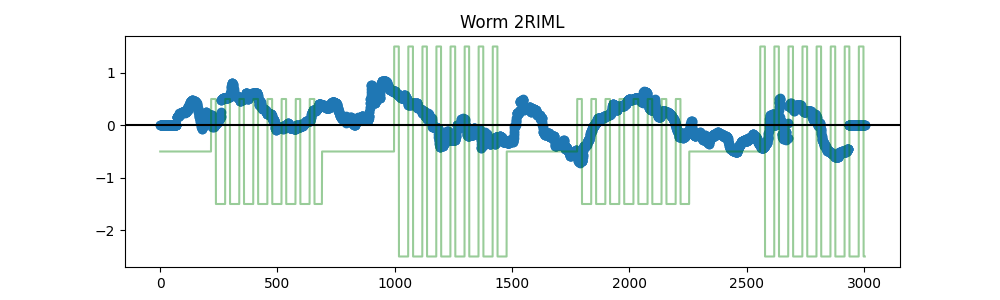

70.36251068115234


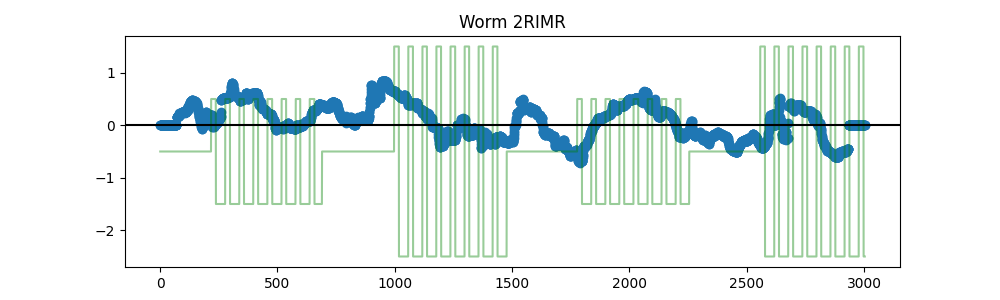

70.36251068115234


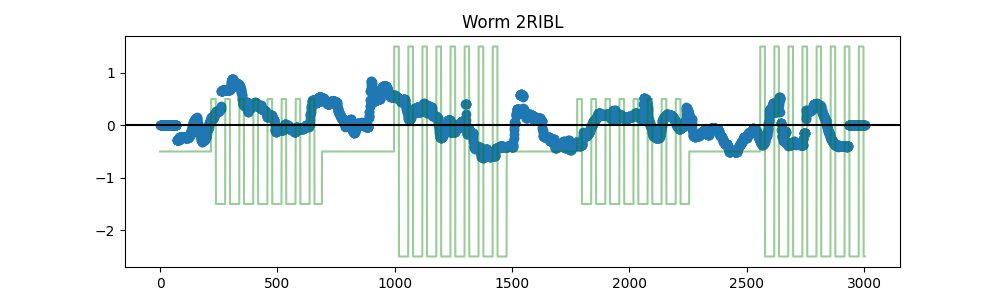

70.36251068115234


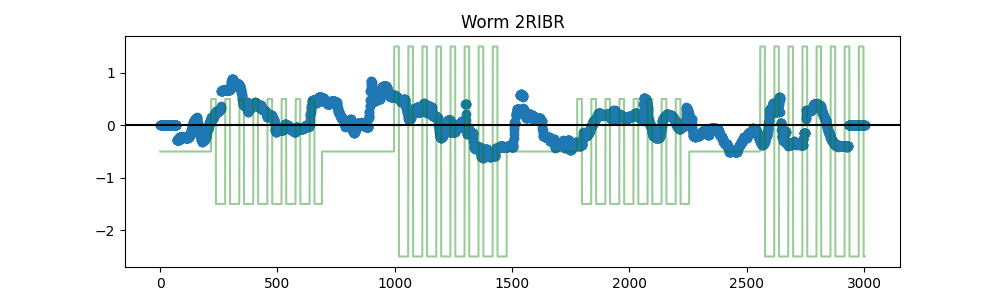

70.36251068115234


In [62]:
n_tit = ["RIA","RIA","RIML","RIMR","RIBL","RIBR"]
d=2
#fig = plt.figure(figsize=(10,3))
for n in range(4):
    fig = plt.figure(figsize=(10,3))
    ax = fig.add_subplot()
    rowsArr_float = copy.deepcopy(MegaData[d,:L[d],:])
    ax.scatter(rowsArr_float[:,12],V12[n,:])
    #ax.scatter(rowsArr_float[:,12],V2[n,:],alpha=0.2 )
    ax.set_title('Worm ' + str(d)+n_tit[n+2])
    ax.plot(MegaData[d,:L[d],12],MegaData[d,:L[d],10]-0.5,alpha=0.4,c='g')
    ax.axhline(0, color='black')
    plt.show()
    print(MegaData[d,100,12])

# Plot distribution of different RIM activities

In [26]:
n_tit = ["RIA","RIA","RIML","RIMR","RIBL","RIBR"]

no RIM for d=0
0.38844603300094604
152.21530128716017
0.4167318312174269
12.58031940460205
11.345258540167757
0.7940696477890015


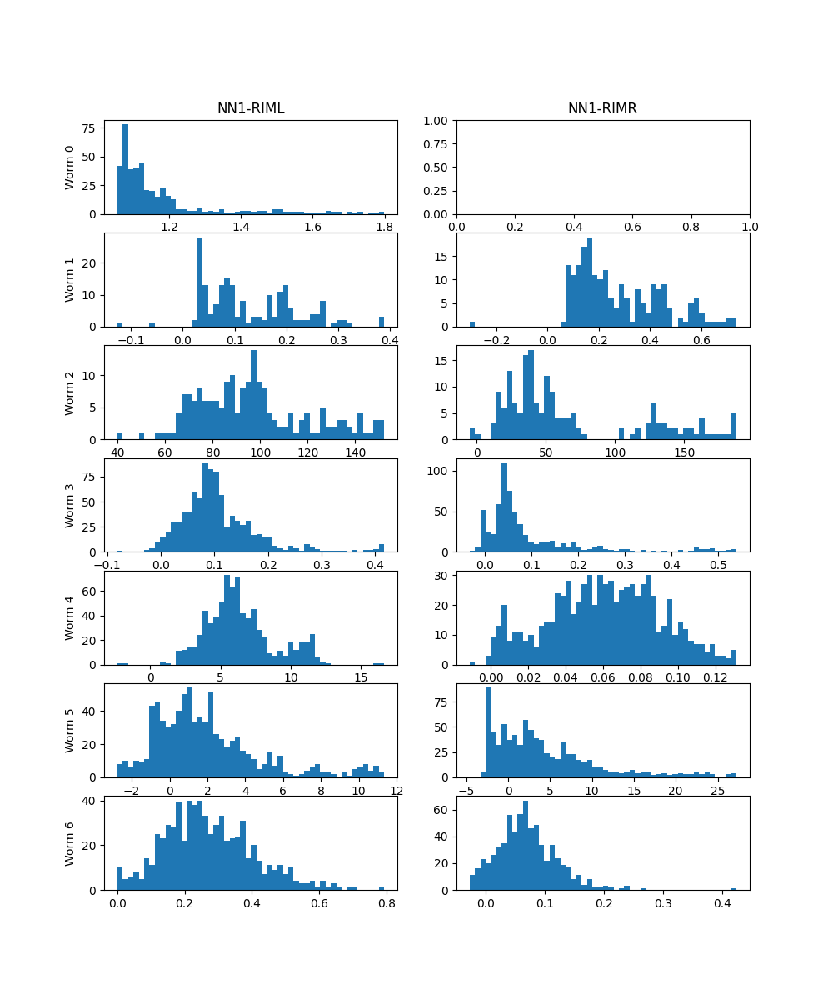

In [27]:
%matplotlib widget
fig,ax = plt.subplots(7,2,figsize=(10,12))
Set = 'NN1-'
velchoice=2
if True:
    for d in range(7):
        st=0
        end=L[d]
        st = AllF.closest_index(MegaData[d,:,12],NN_int[d,0])
        end = AllF.closest_index(MegaData[d,:,12],NN_int[d,1])
        rowsArr_float = MegaData[d,st:end,:]
        rowsArr_float[np.isnan(rowsArr_float[:,velchoice]),velchoice]=0
        nonz1  = np.nonzero(rowsArr_float[:,velchoice])
        ax[d,0].set_ylabel(f'Worm {d}')
        ax[0,0].set_title(Set + n_tit[velchoice])
        ax[0,1].set_title(Set + n_tit[velchoice+1])
        if len(nonz1[0])>1:
            ax[d,0].hist((rowsArr_float[nonz1[0],velchoice]),bins=50)
        nonz1  = np.nonzero(rowsArr_float[:,velchoice+1])
        if len(nonz1[0])>1:
            ax[d,1].hist((rowsArr_float[nonz1[0],velchoice+1]),bins=50)
            print(np.max(rowsArr_float[nonz1[0],velchoice]))
        else:
            print("no RIM for d="+ str(d))
plt.show()

d : 0
d : 1
d : 2
d : 3
d : 4
d : 5
d : 6


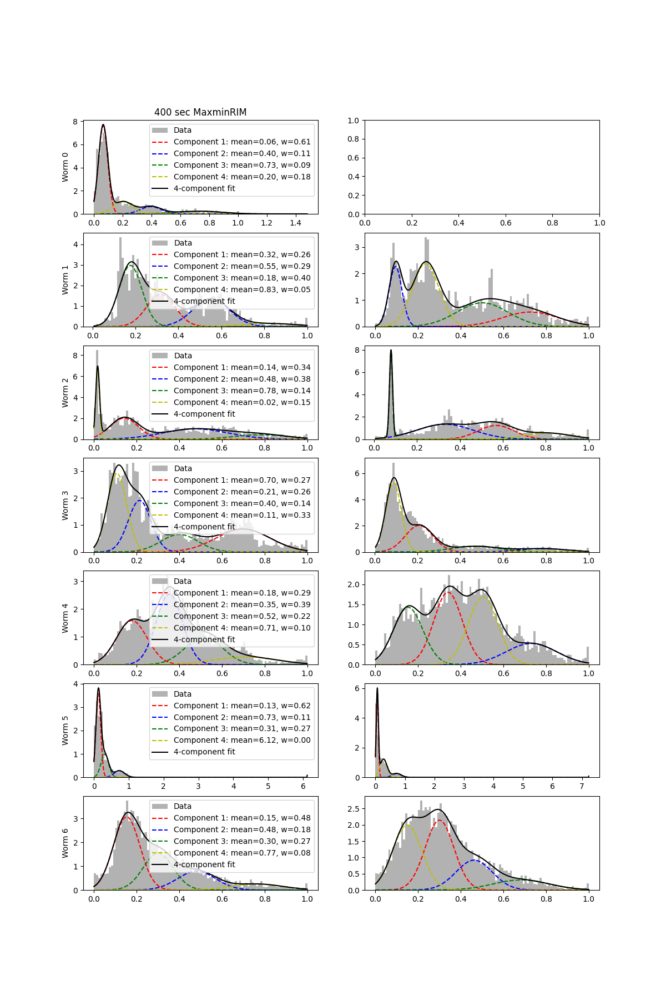

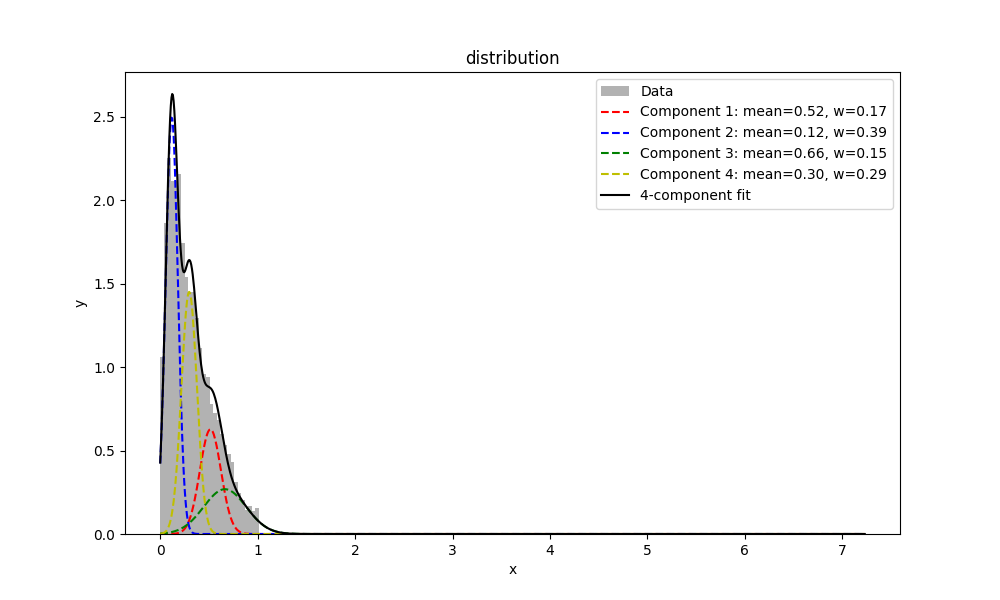

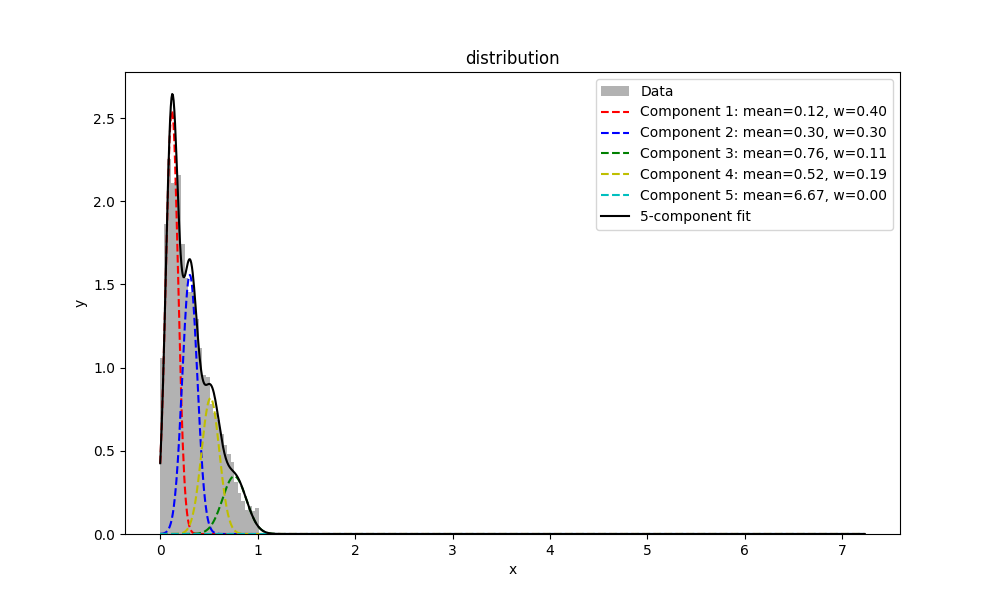

In [29]:
importlib.reload(DF)
%matplotlib widget
fig,ax = plt.subplots(7,2,figsize=(12,18))
subset_data = []
velchoice=2
Set = '400 sec Maxmin'
for d in range(7):
    if d>0 or not (velchoice in [3,5]):
        st=0
        end=L[d]
        #st = AllF.closest_index(MegaData[d,:,12],IAA_int[d,3])
        #end = AllF.closest_index(MegaData[d,:,12],NN_int[d,2])
        indices = np.nonzero(MegaData[d,:L[d],10]==0)[0]
        print('d : '+str(d))
        sec0 = AllF.closest_index(MegaData[d,:,12],2)
        sec60 = AllF.closest_index(MegaData[d,:,12],422)
        interval = int(sec60-sec0)
        if d==0:
            titl = Set + n_title[velchoice]
        else:
            titl = ''
        rowsArr_float0 = DF.compute_everymin_maxmin(MegaData[d,:L[d],velchoice],minlength=int(interval))
        rowsArr_float0[np.isnan(rowsArr_float0)]=0
        rowsArr_float = rowsArr_float0[st:end]
        #rowsArr_float = rowsArr_float0[indices]
        nonz1  = np.nonzero(rowsArr_float)
        plt.subplot(7, 2, 2*(d)+1)
        if len(nonz1[0])>1:  
            DF.plot_4mixedGaussian((rowsArr_float[nonz1[0]]),b=100,xlab='',ylab=f'Worm {d}',titre=titl)
        plt.subplot(7, 2, 2*(d)+2)    
        if d>0 or not (velchoice in [2,4]):
            subset_data.extend((rowsArr_float[nonz1[0]]))
            rowsArr_float0 = DF.compute_everymin_maxmin(MegaData[d,:L[d],velchoice+1],minlength=int(interval))#compute_vector_maxmin
            rowsArr_float0[np.isnan(rowsArr_float0)]=0
            rowsArr_float = rowsArr_float0[st:end]
            nonz1  = np.nonzero(rowsArr_float)
            DF.plot_4mixedGaussian((rowsArr_float[nonz1[0]]),b=100,label=False)
            subset_data.extend((rowsArr_float[nonz1[0]]))        
plt.show()

subset_data = np.array(subset_data)
plt.figure(figsize=(10, 6))
DF.plot_4mixedGaussian(subset_data)
plt.show()
plt.figure(figsize=(10, 6))
DF.plot_5mixedGaussian(subset_data)
plt.show()

d : 0
d : 1
d : 2
d : 3
d : 4
d : 5


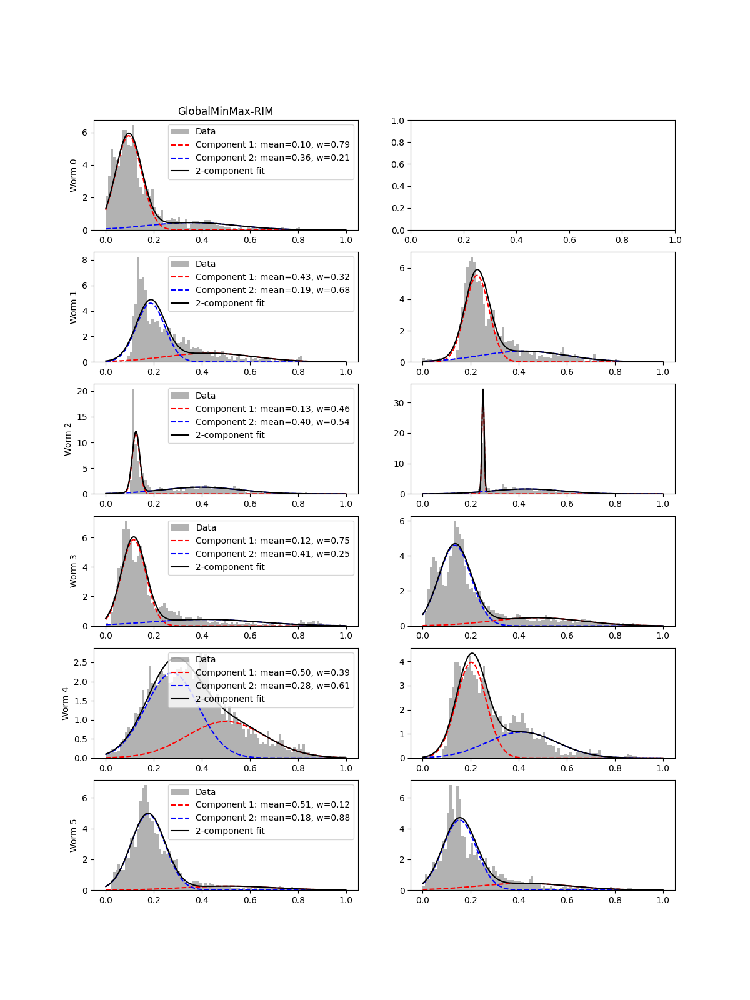

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x741bedc0dc10>
Traceback (most recent call last):
  File "/home/mahsa/anaconda3/envs/Targettrack/lib/python3.8/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/mahsa/anaconda3/envs/Targettrack/lib/python3.8/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/mahsa/anaconda3/envs/Targettrack/lib/python3.8/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/mahsa/anaconda3/envs/Targettrack/lib/python3.8/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'


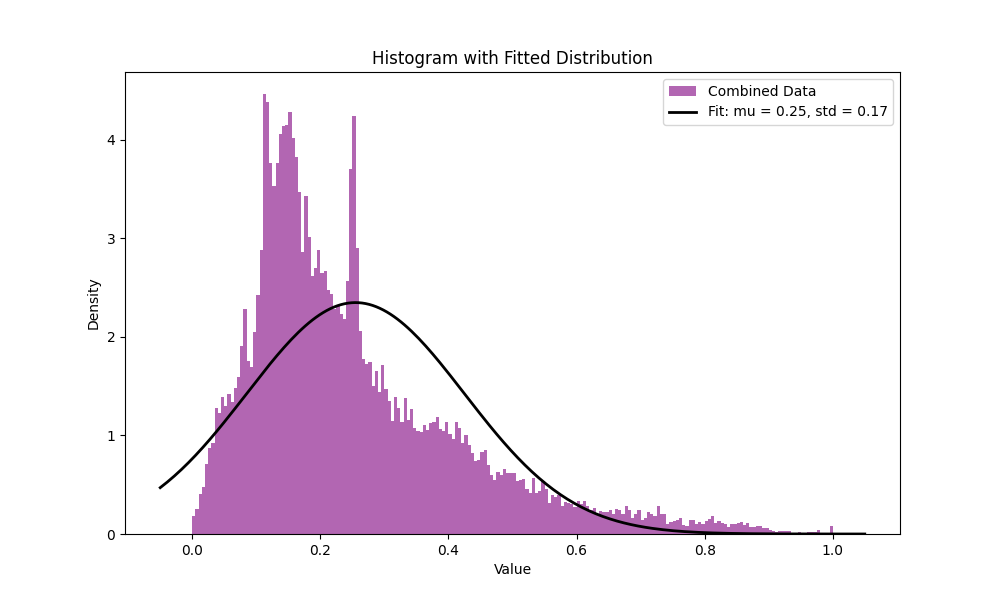

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x741bed685f70>
Traceback (most recent call last):
  File "/home/mahsa/anaconda3/envs/Targettrack/lib/python3.8/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/mahsa/anaconda3/envs/Targettrack/lib/python3.8/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/mahsa/anaconda3/envs/Targettrack/lib/python3.8/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/mahsa/anaconda3/envs/Targettrack/lib/python3.8/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'


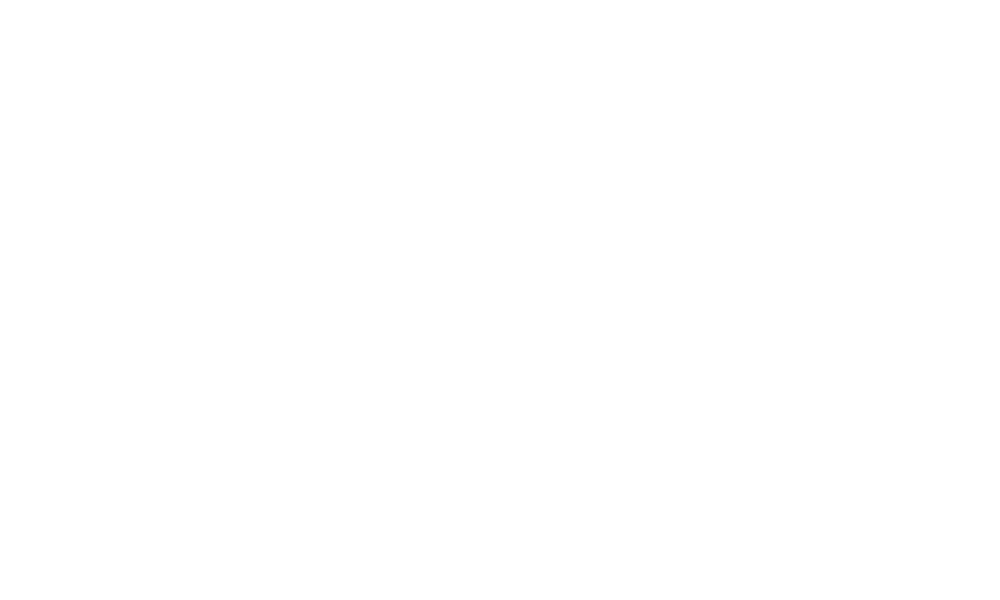

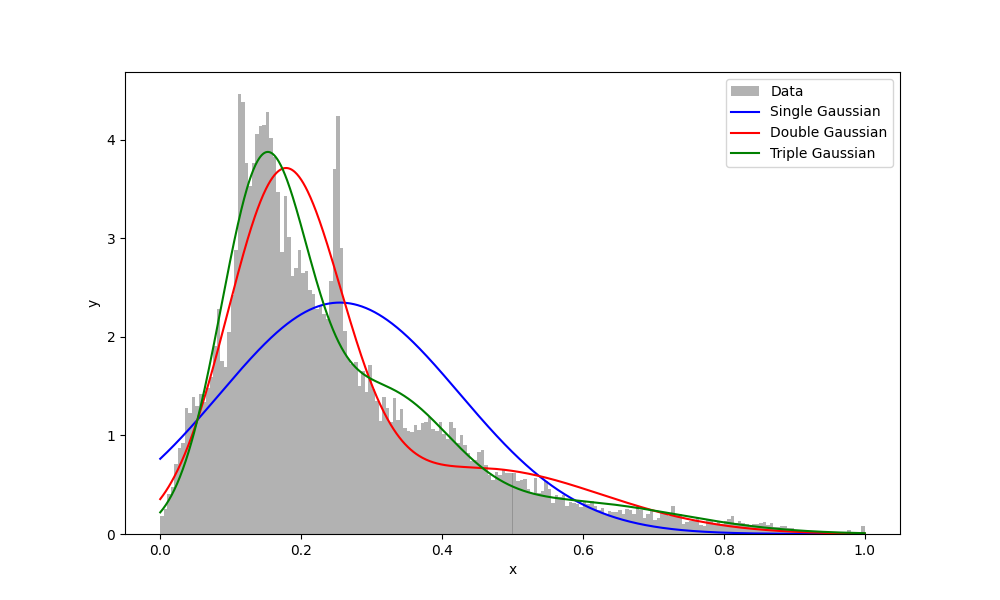

In [82]:
importlib.reload(DF)
%matplotlib widget
fig,ax = plt.subplots(6,2,figsize=(12,16))
subset_data = []
velchoice=2
Set = 'GlobalMinMax-'
if True:
    for d in range(6):
        st=0
        end=L[d]
        #st = closest_index(MegaData[d,:,12],NN_int[d,0])
        #end = closest_index(MegaData[d,:,12],900)
        print('d : '+str(d))
        if d==0:
            titl = Set + n_title[velchoice]
        else:
            titl = ''
        rowsArr_float = copy.deepcopy(MegaData[d,st:end,:])
        rowsArr_float[np.isnan(rowsArr_float[:,velchoice]),velchoice]=0
        nonz1  = np.nonzero(rowsArr_float[:,velchoice])
        plt.subplot(6, 2, 2*(d)+1)
        DF.plot_2mixedGaussian(DF.compute_vector_maxmin(rowsArr_float[nonz1[0],velchoice]),b=100,xlab='',ylab=f'Worm {d}',titre=titl)#plot_4mixedGaussian
        subset_data.extend(DF.compute_vector_maxmin(rowsArr_float[nonz1[0],velchoice]))
        nonz1  = np.nonzero(rowsArr_float[:,velchoice+1])
        if d>0 or not(velchoice in [2,4]):
            plt.subplot(6, 2, 2*(d)+2)

            DF.plot_2mixedGaussian(DF.compute_vector_maxmin(rowsArr_float[nonz1[0],velchoice+1]),b=100,label=False)
            subset_data.extend(DF.compute_vector_maxmin(rowsArr_float[nonz1[0],velchoice+1]))        
plt.show()

subset_data = np.array(subset_data)
plt.figure(figsize=(10, 6))
DF.plot_hist_distr1(subset_data)
plt.show()
plt.figure(figsize=(10, 6))
DF.plot_histogram_distr(subset_data)


d:0
d:1
d:2
d:3
d:4
d:5


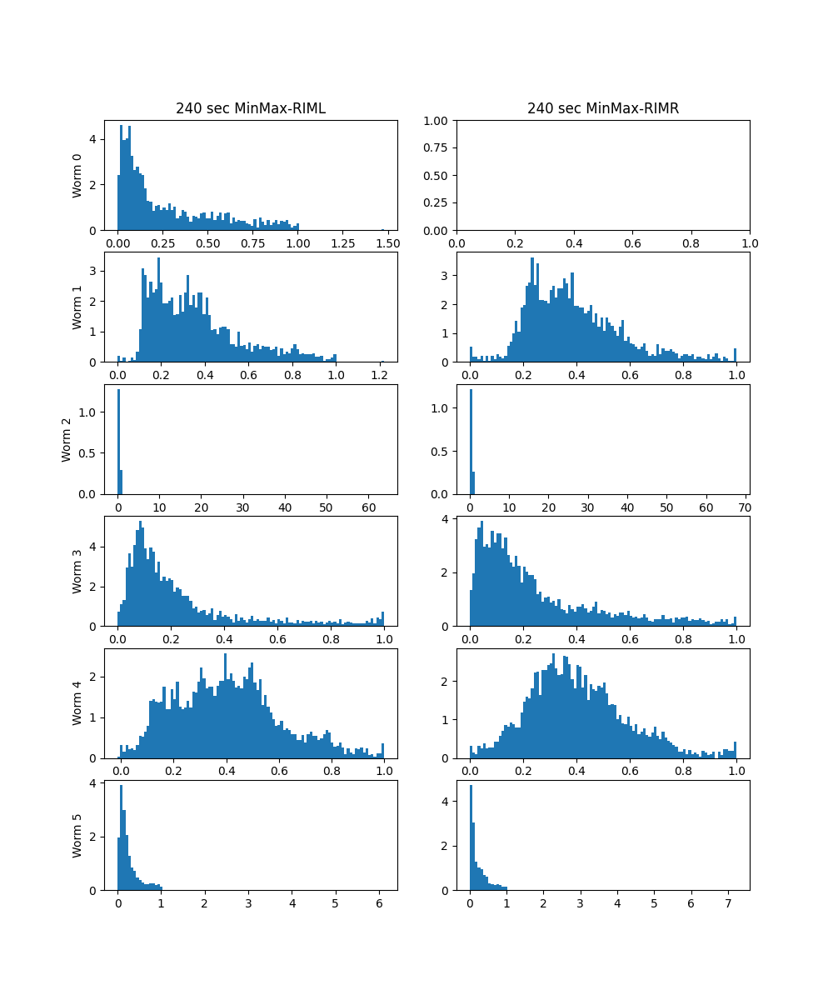

In [91]:
%matplotlib widget
fig,ax = plt.subplots(6,2,figsize=(10,12))
Set = '240 sec MinMax-'
velchoice=2
if True:
    for d in range(6):
        print("d:"+str(d))
        sec0 = AllF.closest_index(MegaData0[d,:,12],2)
        sec60 = AllF.closest_index(MegaData0[d,:,12],242)
        interval = int(sec60-sec0)
        ax[d,0].set_ylabel(f'Worm {d}')
        ax[0,0].set_title(Set + n_tit[velchoice])
        ax[0,1].set_title(Set + n_tit[velchoice+1])
        st=0
        end=L[d]
        #st = closest_index(MegaData[d,:,12],IAA_int[d,2])
        #end = closest_index(MegaData[d,:,12],IAA_int[d,3])
        rowsArr_float = copy.deepcopy(MegaData[d,st:end,:])
        rowsArr_float[np.isnan(rowsArr_float[:,velchoice]),velchoice]=0
        nonz1  = np.nonzero(rowsArr_float[:,velchoice])
        ax[d,0].hist(DF.compute_everymin_maxmin(rowsArr_float[nonz1[0],velchoice],minlength=int(interval)),bins=100, density=True)
        if d>0:
            nonz1  = np.nonzero(rowsArr_float[:,velchoice+1])
            ax[d,1].hist(DF.compute_everymin_maxmin(rowsArr_float[nonz1[0],velchoice+1],minlength=int(interval)),bins=100, density=True)
plt.show()

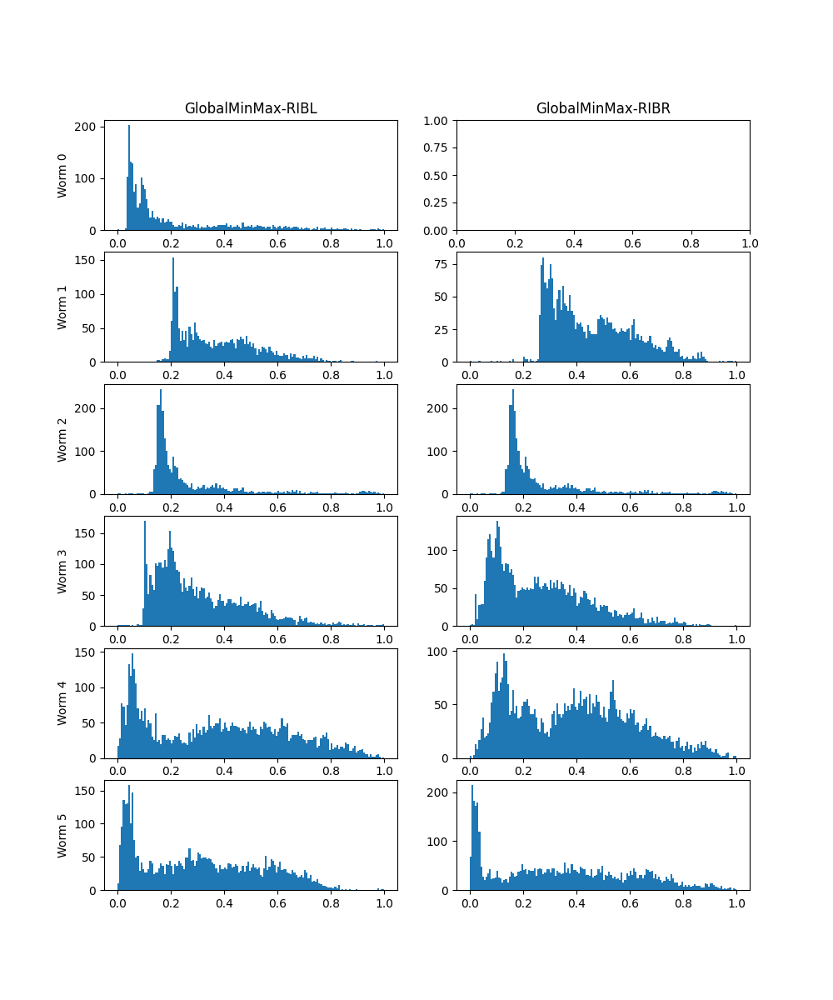

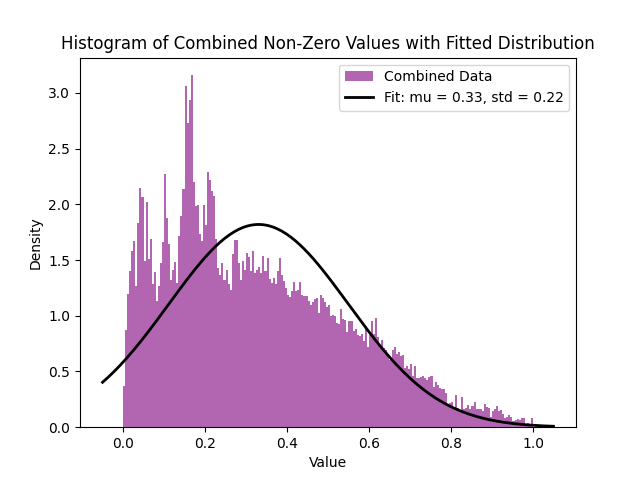

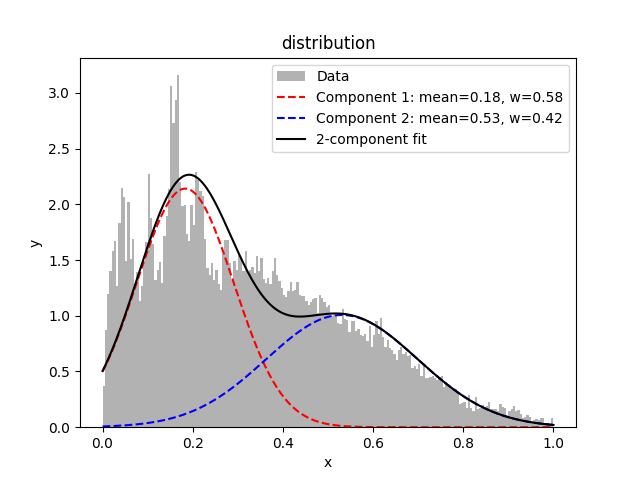

In [30]:
%matplotlib widget
fig,ax = plt.subplots(6,2,figsize=(10,12))
non_zero_values = []
velchoice=4
binss = 150
Set = 'GlobalMinMax-'
if True:
    for d in range(6):
        st=0
        end=L[d]
        ax[d,0].set_ylabel(f'Worm {d}')
        ax[0,0].set_title(Set + n_tit[velchoice])
        ax[0,1].set_title(Set + n_tit[velchoice+1])
        rowsArr_float = MegaData[d,st:end,:]
        rowsArr_float[np.isnan(rowsArr_float[:,velchoice]),velchoice]=0
        nonz1  = np.nonzero(rowsArr_float[:,velchoice])
        
        ax[d,0].hist(DF.compute_vector_maxmin(rowsArr_float[nonz1[0],velchoice]),bins=binss)#compute_vector_maxmin
        non_zero_values.extend(DF.compute_vector_maxmin(rowsArr_float[nonz1[0],velchoice]))#compute_vector_maxmin
        nonz1  = np.nonzero(rowsArr_float[:,velchoice+1])
        if d>0 or not(velchoice in [2,4]):
            ax[d,1].hist(DF.compute_vector_maxmin(rowsArr_float[nonz1[0],velchoice+1]),bins=binss)#compute_vector_maxmin
            non_zero_values.extend(DF.compute_vector_maxmin(rowsArr_float[nonz1[0],velchoice+1]))#compute_vector_maxmin
plt.show()

non_zero_values = np.array(non_zero_values)

plt.figure()
plt.hist(non_zero_values, bins=200, density=True, alpha=0.6, color='purple', label='Combined Data')

# Fit a distribution to the combined data
mu, std = stats.norm.fit(non_zero_values)

# Plot the PDF of the fitted distribution
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 200)
p = stats.norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, label=f'Fit: mu = {mu:.2f}, std = {std:.2f}')

# Add labels and legend
plt.xlabel('Value')
plt.ylabel('Density')
plt.title('Histogram of Combined Non-Zero Values with Fitted Distribution')
plt.legend()
plt.show()
plt.figure()
DF.plot_2mixedGaussian(non_zero_values)


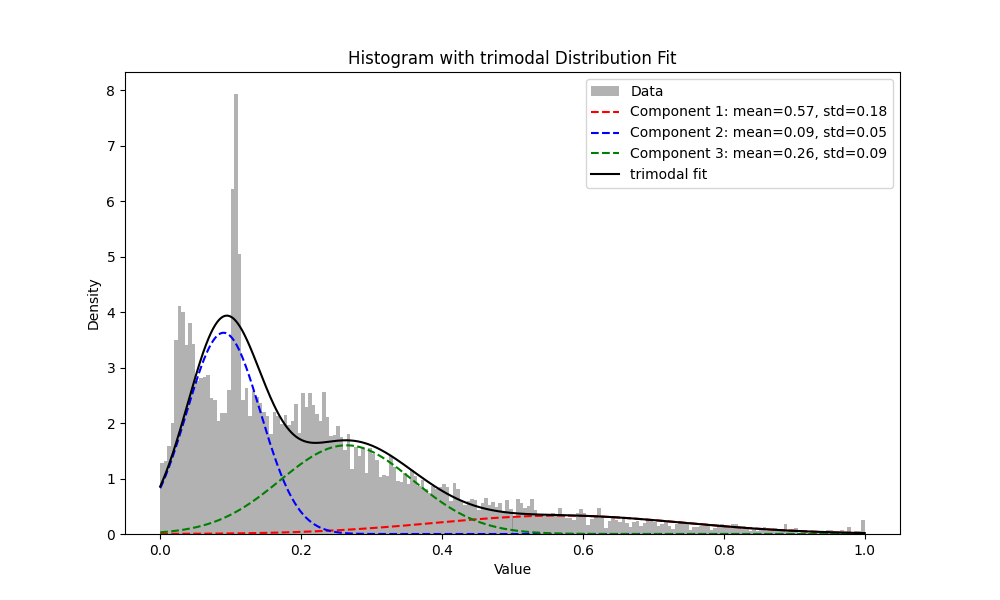

In [117]:

data = subset_data##non_zero_values
gmm = GaussianMixture(n_components=3, covariance_type='full')
gmm.fit(data.reshape(-1, 1))

# Extract the means, covariances, and weights of the fitted Gaussians
means = gmm.means_.flatten()
covariances = gmm.covariances_.flatten()
weights = gmm.weights_.flatten()

# Generate a range of values for plotting the PDF
x = np.linspace(min(data), max(data), 1000)

# Calculate the PDF for each Gaussian component
pdf_1 = weights[0] * stats.norm.pdf(x, means[0], np.sqrt(covariances[0]))
pdf_2 = weights[1] * stats.norm.pdf(x, means[1], np.sqrt(covariances[1]))
pdf_3 = weights[2] * stats.norm.pdf(x, means[2], np.sqrt(covariances[2]))
pdf_bimodal = pdf_1 + pdf_2+ pdf_3

# Plot the histogram of the data
plt.figure(figsize=(10, 6))
plt.hist(data, bins=200, density=True, alpha=0.6, color='gray', label='Data')

# Plot the individual Gaussian components
plt.plot(x, pdf_1, 'r--', label=f'Component 1: mean={means[0]:.2f}, std={np.sqrt(covariances[0]):.2f}')
plt.plot(x, pdf_2, 'b--', label=f'Component 2: mean={means[1]:.2f}, std={np.sqrt(covariances[1]):.2f}')
plt.plot(x, pdf_3, 'g--', label=f'Component 3: mean={means[2]:.2f}, std={np.sqrt(covariances[2]):.2f}')
# Plot the combined bimodal distribution
plt.plot(x, pdf_bimodal, 'k-', label='trimodal fit')

# Add labels and legend
plt.xlabel('Value')
plt.ylabel('Density')
plt.title('Histogram with trimodal Distribution Fit')
plt.legend()

# Show the plot
plt.show()

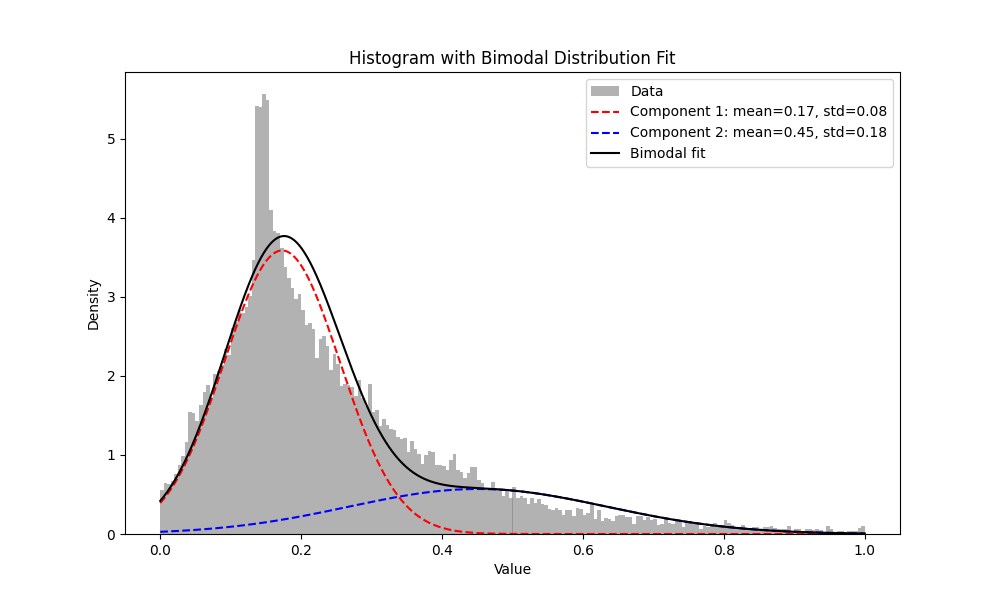

In [118]:
from sklearn.mixture import GaussianMixture
data = non_zero_values
gmm = GaussianMixture(n_components=2, covariance_type='full')
gmm.fit(data.reshape(-1, 1))

# Extract the means, covariances, and weights of the fitted Gaussians
means = gmm.means_.flatten()
covariances = gmm.covariances_.flatten()
weights = gmm.weights_.flatten()

# Generate a range of values for plotting the PDF
x = np.linspace(min(data), max(data), 1000)

# Calculate the PDF for each Gaussian component
pdf_1 = weights[0] * stats.norm.pdf(x, means[0], np.sqrt(covariances[0]))
pdf_2 = weights[1] * stats.norm.pdf(x, means[1], np.sqrt(covariances[1]))

pdf_bimodal = pdf_1 + pdf_2

# Plot the histogram of the data
plt.figure(figsize=(10, 6))
plt.hist(data, bins=200, density=True, alpha=0.6, color='gray', label='Data')

# Plot the individual Gaussian components
plt.plot(x, pdf_1, 'r--', label=f'Component 1: mean={means[0]:.2f}, std={np.sqrt(covariances[0]):.2f}')
plt.plot(x, pdf_2, 'b--', label=f'Component 2: mean={means[1]:.2f}, std={np.sqrt(covariances[1]):.2f}')

# Plot the combined bimodal distribution
plt.plot(x, pdf_bimodal, 'k-', label='Bimodal fit')

# Add labels and legend
plt.xlabel('Value')
plt.ylabel('Density')
plt.title('Histogram with Bimodal Distribution Fit')
plt.legend()

# Show the plot
plt.show()

In [ ]:
bic_single = gmm_single.bic(data_reshaped)
bic_bimodal = gmm_bimodal.bic(data_reshaped)
aic_single = gmm_single.aic(data_reshaped)
aic_bimodal = gmm_bimodal.aic(data_reshaped)

print(f"BIC for single Gaussian: {bic_single}")
print(f"BIC for bimodal Gaussian: {bic_bimodal}")
print(f"AIC for single Gaussian: {aic_single}")
print(f"AIC for bimodal Gaussian: {aic_bimodal}")

# Determine the better model based on BIC/AIC
if bic_bimodal < bic_single:
    print("Bimodal fit is better according to BIC.")
else:
    print("Single Gaussian fit is better according to BIC.")

if aic_bimodal < aic_single:
    print("Bimodal fit is better according to AIC.")
else:
    print("Single Gaussian fit is better according to AIC.")

# Plot whole RIM activity

In [80]:
# change the odor labels
MegaData = np.copy(h5['data/dataraw'])
for d in range(1,7):
    nn1 = np.nonzero((MegaData[d,:L[d],12]>750) & (MegaData[d,:L[d],12]< 1500))
    for t in nn1[0]:
        if MegaData[d,t,10]:
            MegaData[d,t,10]=2
    nn1 = np.nonzero(MegaData[d,:L[d],12]>2300)
    for t in nn1[0]:
        if MegaData[d,t,10]:
            MegaData[d,t,10]=2

In [81]:
for d in range(1,7):
    sec0 = closest_index(MegaData[d,:,12],2)
    sec60 = closest_index(MegaData[d,:,12],42)
    interval = int(sec60-sec0)
    for t in range(interval,L[d]):
        if MegaData[d,t,12]>IAA_int[d,0] and MegaData[d,t,12]<IAA_int[d,1]:
            if (1 in np.unique(MegaData[d,(t-interval):t,10])) and MegaData[d,t,10]==0:
                MegaData[d,t,10]=-1
        elif MegaData[d,t,12]>IAA_int[d,2] and MegaData[d,t,12]<IAA_int[d,3]:
            if (1 in np.unique(MegaData[d,(t-interval):t,10])) and MegaData[d,t,10]==0:
                MegaData[d,t,10]=-1  
        elif MegaData[d,t,12]>NN_int[d,0] and MegaData[d,t,12]<NN_int[d,1]:
            if (2 in np.unique(MegaData[d,(t-interval):t,10])) and MegaData[d,t,10]==0:
                MegaData[d,t,10]=-2  
        elif MegaData[d,t,12]>NN_int[d,2] and MegaData[d,t,12]<NN_int[d,3]:
            if (2 in np.unique(MegaData[d,(t-interval):t,10])) and MegaData[d,t,10]==0:
                MegaData[d,t,10]=-2

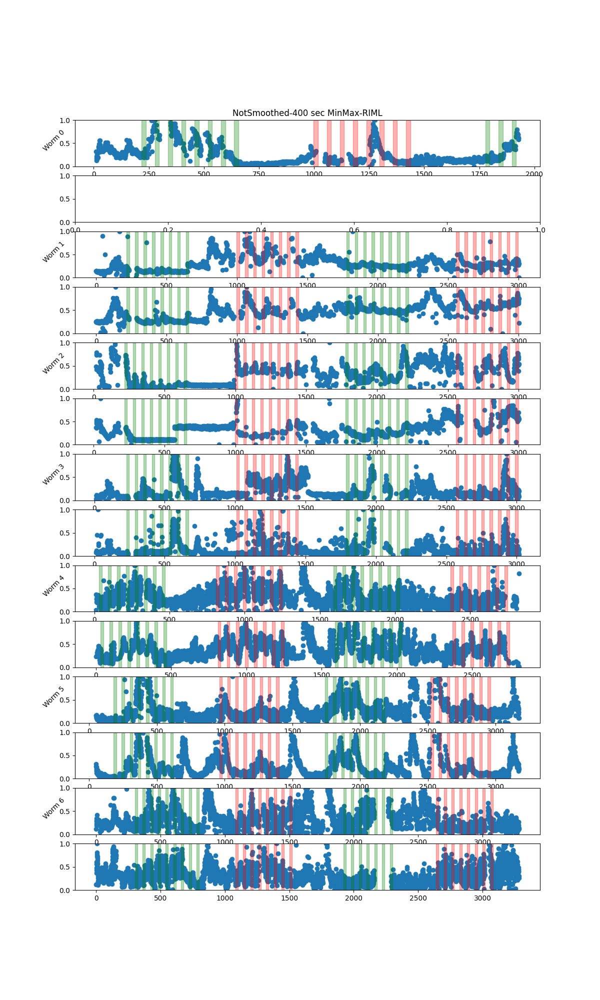

In [34]:
fig,ax = plt.subplots(14,1,figsize=(12,20))
Set = 'NotSmoothed-400 sec MinMax-'
velchoice=2
if True:
    for d in range(7):
        sec0 = AllF.closest_index(MegaData[d,:,12],2)
        sec60 = AllF.closest_index(MegaData[d,:,12],420)
        interval = int(sec60-sec0)
        rowsArr_float = copy.deepcopy(MegaData0[d,:L[d],:])
        rowsArr_float[np.isnan(rowsArr_float[:,velchoice]),velchoice]=0
        startIAA,EndIAA = AllF.get_nonzero_start_end(rowsArr_float[:,10]==1)
        start2NN,End2NN = AllF.get_nonzero_start_end(rowsArr_float[:,10]==2)
        nonz1  = np.nonzero(rowsArr_float[:,velchoice])
        ax[2*d].set_ylabel(f'Worm {d}',rotation=45)
        ax[0].set_title(Set + n_tit[velchoice])
        ax[2*(d)].scatter(rowsArr_float[nonz1[0],12],DF.compute_everymin_maxmin(rowsArr_float[nonz1[0],velchoice],minlength=int(interval)))
        #ax[2*(d-1)].plot(rowsArr_float[:,12],rowsArr_float[:,10],color='r')
        nonz1  = np.nonzero(rowsArr_float[:,velchoice+1])
        if d>0 or not(velchoice in [2,4]):
            ax[2*(d)+1].scatter(rowsArr_float[nonz1[0],12],DF.compute_everymin_maxmin(rowsArr_float[nonz1[0],velchoice+1],minlength=int(interval)))
        #ax[2*(d-1)+1].plot(rowsArr_float[:,12],rowsArr_float[:,10],color='r')
        for o in range(len(startIAA)):
            ax[2*(d)].axvspan(rowsArr_float[startIAA[o],12],rowsArr_float[EndIAA[o],12], color='green',alpha=0.3)
            if d>0 or not(velchoice in [2,4]):
                ax[2*(d)+1].axvspan(rowsArr_float[startIAA[o],12],rowsArr_float[EndIAA[o],12], color='green',alpha=0.3)
        for o in range(len(start2NN)):    
            ax[2*(d)].axvspan(rowsArr_float[start2NN[o],12],rowsArr_float[End2NN[o],12], color='red',alpha=0.3)
            if d>0 or not(velchoice in [2,4]):
                ax[2*(d)+1].axvspan(rowsArr_float[start2NN[o],12],rowsArr_float[End2NN[o],12], color='red',alpha=0.3)
        ax[2*(d)+1].set_ylim(0,1)   
        ax[2*(d)].set_ylim(0,1) 
plt.show()

In [172]:
d=1
print(L[1])
np.argmax(MegaData[d,:,2])

4297


610

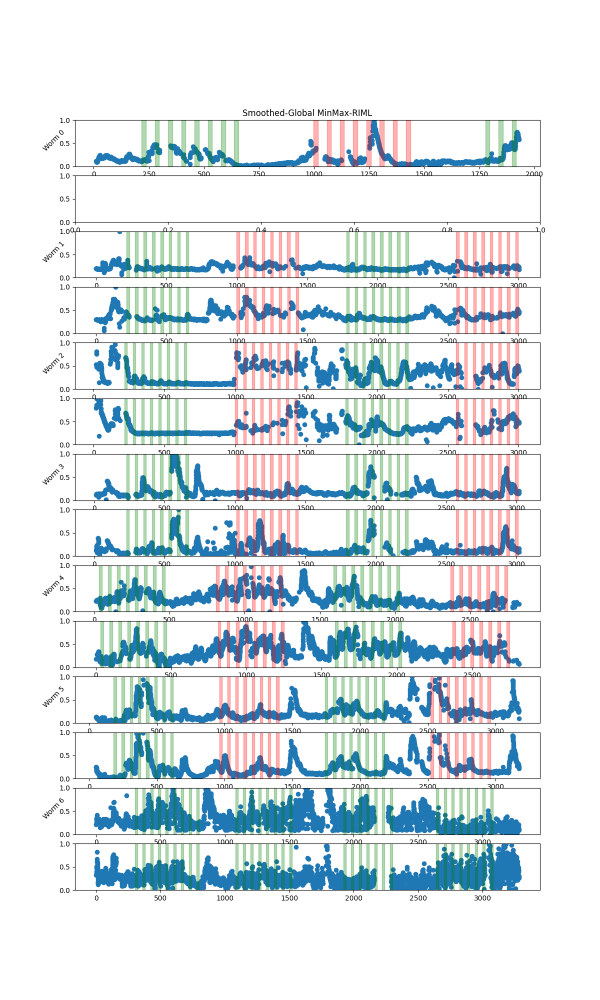

In [35]:
fig,ax = plt.subplots(14,1,figsize=(12,20))
Set = 'Smoothed-Global MinMax-'
velchoice=2
if True:
    for d in range(7):
        sec0 = AllF.closest_index(MegaData[d,:,12],2)
        sec60 = AllF.closest_index(MegaData[d,:,12],420)
        interval = int(sec60-sec0)
        rowsArr_float = copy.deepcopy(MegaData[d,:L[d],:])
        rowsArr_float[np.isnan(rowsArr_float[:,velchoice]),velchoice]=0
        startIAA,EndIAA = AllF.get_nonzero_start_end(rowsArr_float[:,10]==1)
        start2NN,End2NN = AllF.get_nonzero_start_end(rowsArr_float[:,10]==2)
        nonz1  = np.nonzero(rowsArr_float[:,velchoice])
        ax[2*d].set_ylabel(f'Worm {d}',rotation=45)
        ax[0].set_title(Set + n_tit[velchoice])
        ax[2*(d)].scatter(rowsArr_float[nonz1[0],12],DF.compute_vector_maxmin(rowsArr_float[nonz1[0],velchoice]))
        #ax[2*(d-1)].plot(rowsArr_float[:,12],rowsArr_float[:,10],color='r')
        nonz1  = np.nonzero(rowsArr_float[:,velchoice+1])
        if d>0 or not(velchoice in [2,4]):
            ax[2*(d)+1].scatter(rowsArr_float[nonz1[0],12],DF.compute_vector_maxmin(rowsArr_float[nonz1[0],velchoice+1]))
        #ax[2*(d-1)+1].plot(rowsArr_float[:,12],rowsArr_float[:,10],color='r')
        for o in range(len(startIAA)):
            ax[2*(d)].axvspan(rowsArr_float[startIAA[o],12],rowsArr_float[EndIAA[o],12], color='green',alpha=0.3)
            if d>0 or not(velchoice in [2,4]):
                ax[2*(d)+1].axvspan(rowsArr_float[startIAA[o],12],rowsArr_float[EndIAA[o],12], color='green',alpha=0.3)
        for o in range(len(start2NN)):    
            ax[2*(d)].axvspan(rowsArr_float[start2NN[o],12],rowsArr_float[End2NN[o],12], color='red',alpha=0.3)
            if d>0 or not(velchoice in [2,4]):
                ax[2*(d)+1].axvspan(rowsArr_float[start2NN[o],12],rowsArr_float[End2NN[o],12], color='red',alpha=0.3)
        ax[2*(d)+1].set_ylim(0,1)   
        ax[2*(d)].set_ylim(0,1) 
plt.show()

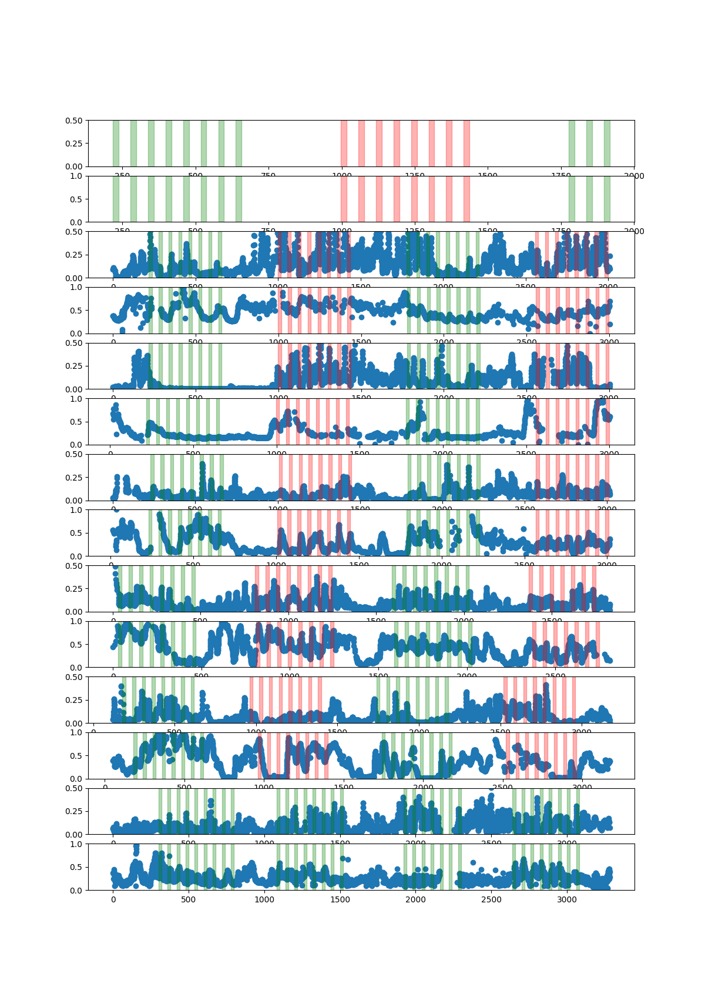

In [39]:
#plot one behavior vs neuron
fig,ax = plt.subplots(14,1,figsize=(12,17))

velchoice=46
nchoice = 5
if True:
    for d in range(7):
        interval = int(sec60-sec0)
        rowsArr_float = copy.deepcopy(MegaData[d,:L[d],:])
        rowsArr_float[np.isnan(rowsArr_float[:,velchoice]),velchoice]=0
        startIAA,EndIAA = AllF.get_nonzero_start_end(rowsArr_float[:,10]==1)
        start2NN,End2NN = AllF.get_nonzero_start_end(rowsArr_float[:,10]==2)
        nonz1  = np.nonzero(rowsArr_float[:,velchoice])
        if d>0 or not(velchoice in [46,45,47]):
            ax[2*(d)].scatter(rowsArr_float[nonz1[0],12],AllF.smooth_vec(DF.compute_vector_maxmin(rowsArr_float[nonz1[0],velchoice])))
        #ax[2*(d-1)].plot(rowsArr_float[:,12],rowsArr_float[:,10],color='r')
        nonz1  = np.nonzero(rowsArr_float[:,nchoice])    
        if d>0 or not(nchoice in [3,5]):
            ax[2*(d)+1].scatter(rowsArr_float[nonz1[0],12],DF.compute_vector_maxmin(rowsArr_float[nonz1[0],nchoice]))
        #ax[2*(d-1)+1].plot(rowsArr_float[:,12],rowsArr_float[:,10],color='r')
        for o in range(len(startIAA)):
            ax[2*(d)].axvspan(rowsArr_float[startIAA[o],12],rowsArr_float[EndIAA[o],12], color='green',alpha=0.3)
            if d>0 or not(velchoice in [2,4]):
                ax[2*(d)+1].axvspan(rowsArr_float[startIAA[o],12],rowsArr_float[EndIAA[o],12], color='green',alpha=0.3)
        for o in range(len(start2NN)):    
            ax[2*(d)].axvspan(rowsArr_float[start2NN[o],12],rowsArr_float[End2NN[o],12], color='red',alpha=0.3)
            if d>0 or not(velchoice in [2,4]):
                ax[2*(d)+1].axvspan(rowsArr_float[start2NN[o],12],rowsArr_float[End2NN[o],12], color='red',alpha=0.3)
        ax[2*(d)+1].set_ylim(0,1)   
        ax[2*(d)].set_ylim(0,0.5) 
        #ax[2*(d)].set_xlim(0,3000) 
        #ax[2*(d)+1].set_xlim(0,3000) 
plt.show()

2.01419854164124
1.4614503383636475
0.3728893561562999
0.14025449820441935


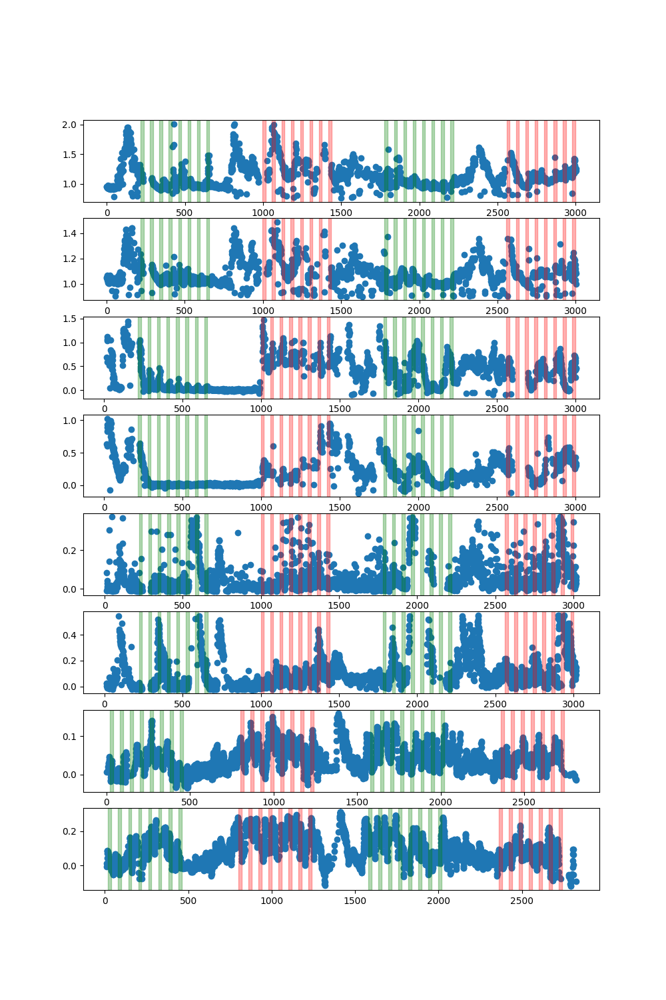

In [145]:
fig,ax = plt.subplots(8,1,figsize=(10,15))

velchoice=2
if True:
    for d in [1,2,3,4]:
        rowsArr_float = MegaData[d,:L[d],:]
        rowsArr_float[np.isnan(rowsArr_float[:,velchoice]),velchoice]=0
        startIAA,EndIAA = get_nonzero_start_end(rowsArr_float[:,10]==1)
        start2NN,End2NN = get_nonzero_start_end(rowsArr_float[:,10]==2)
        nonz1  = np.nonzero(rowsArr_float[:,velchoice])
        ax[2*(d-1)].scatter(rowsArr_float[nonz1[0],12],(rowsArr_float[nonz1[0],velchoice]))
        #ax[2*(d-1)].plot(rowsArr_float[:,12],rowsArr_float[:,10],color='r')
        nonz1  = np.nonzero(rowsArr_float[:,velchoice+1])
        ax[2*(d-1)+1].scatter(rowsArr_float[nonz1[0],12],(rowsArr_float[nonz1[0],velchoice+1]))
        #ax[2*(d-1)+1].plot(rowsArr_float[:,12],rowsArr_float[:,10],color='r')
        for o in range(len(startIAA)):
            ax[2*(d-1)+1].axvspan(rowsArr_float[startIAA[o],12],rowsArr_float[EndIAA[o],12], color='green',alpha=0.3)
            ax[2*(d-1)].axvspan(rowsArr_float[startIAA[o],12],rowsArr_float[EndIAA[o],12], color='green',alpha=0.3)
        for o in range(len(start2NN)):    
            ax[2*(d-1)+1].axvspan(rowsArr_float[start2NN[o],12],rowsArr_float[End2NN[o],12], color='red',alpha=0.3)
            ax[2*(d-1)].axvspan(rowsArr_float[start2NN[o],12],rowsArr_float[End2NN[o],12], color='red',alpha=0.3)
        print(np.max(rowsArr_float[nonz1[0],velchoice]))
plt.show()

# Plot crosscorrelation of RIB and RIM combnations

In [114]:
DF.plot_crosscorrelation(Cross_corr_neuronsRIBRIM_sum,b,limits=10,n_title=['RIB+RIM','RIB+RIM','RIB+RIM','RIB+RIM'])

NameError: name 'Cross_corr_neuronsRIBRIM_sum' is not defined

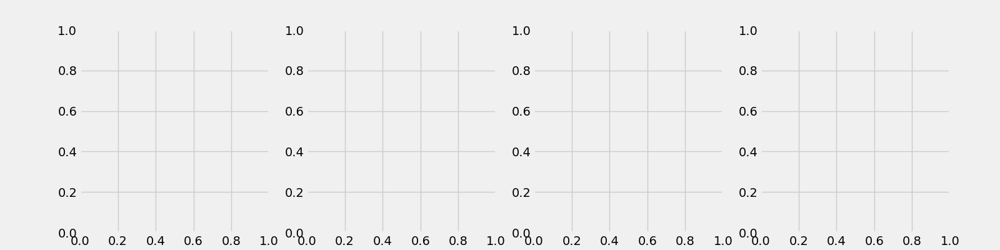

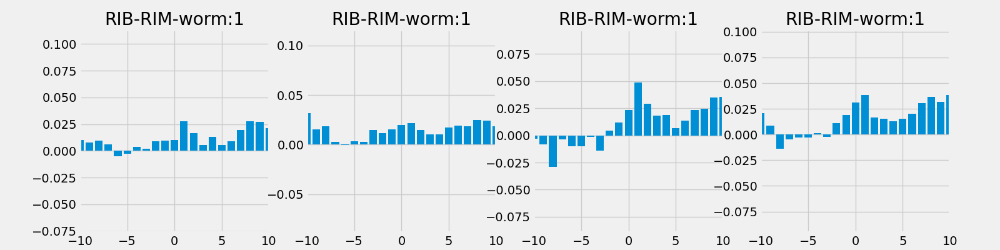

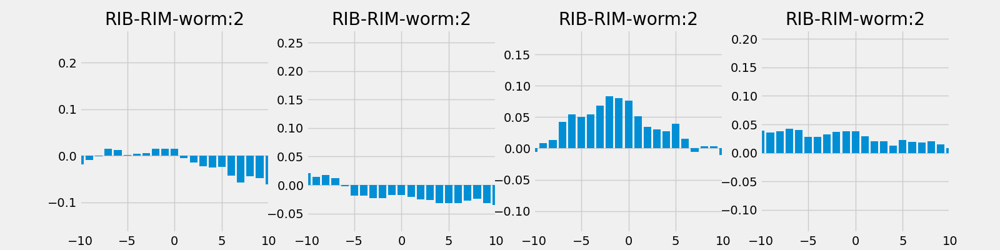

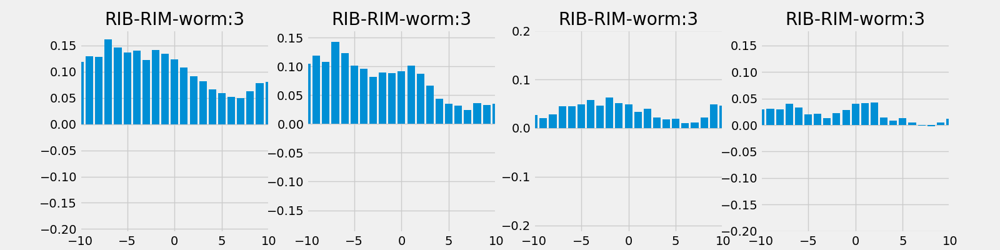

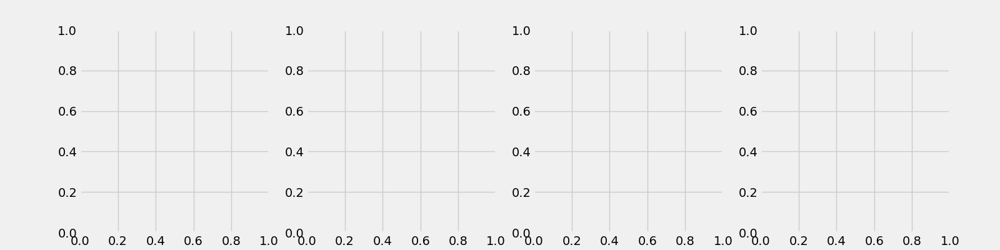

In [61]:
plot_crosscorrelation(Cross_corr_neuronsRIBRIM_min,b,limits=10,n_title=['RIB-RIM','RIB-RIM','RIB-RIM','RIB-RIM'])

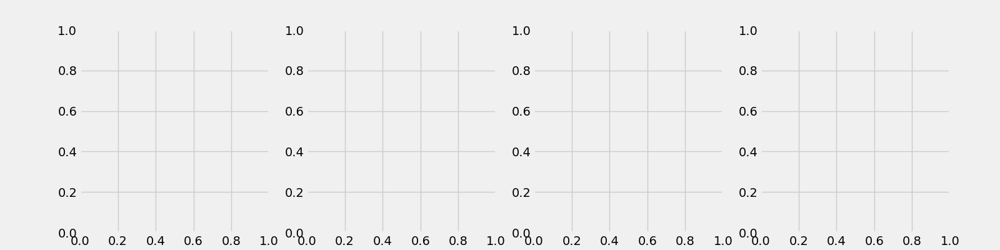

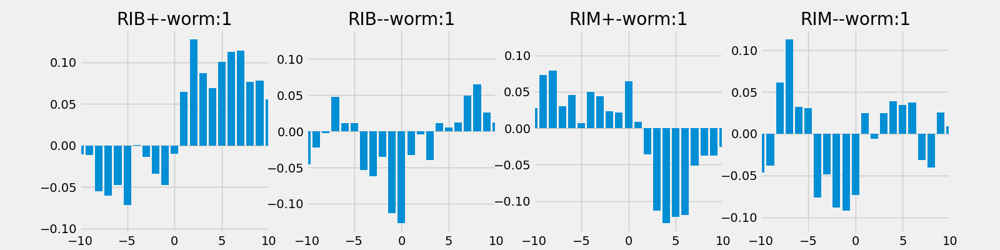

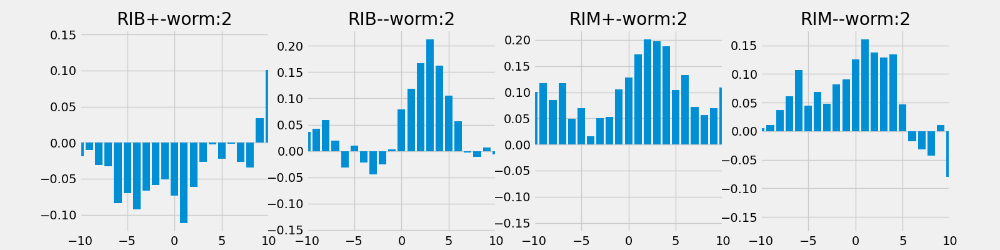

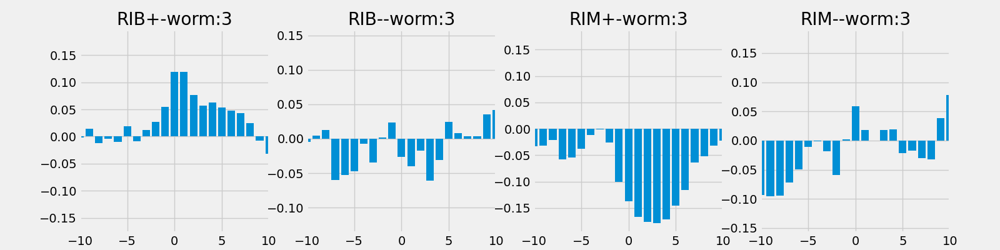

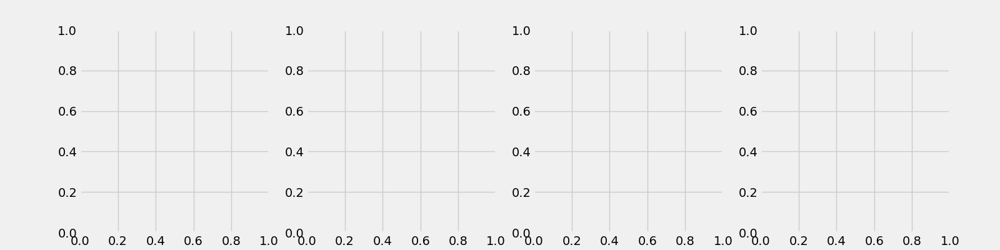

In [44]:
plot_crosscorrelation(Cross_corr_neuronsRIBRIM_sumsubs,b,limits=10,n_title=['RIB+','RIB-','RIM+','RIM-'])

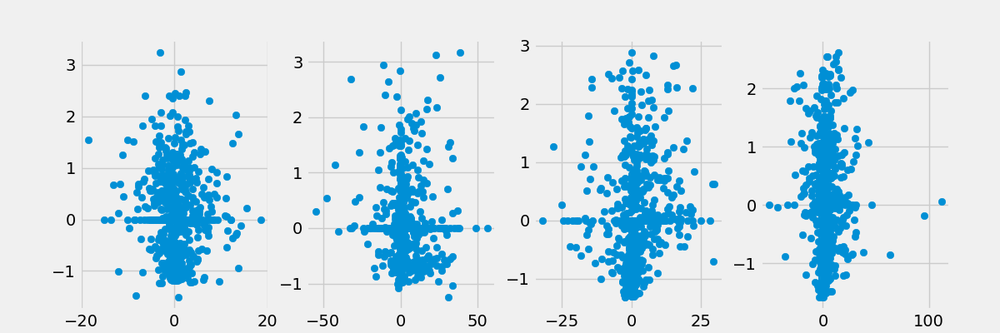

In [34]:
fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(141) 
        
ax2 = fig.add_subplot(142) 
ax3 = fig.add_subplot(143)
ax4 = fig.add_subplot(144)
d=1
n=4
ax.scatter(behaviorBin[d,:mb*b[d]],NeuronalActivity_bin[d,n,:mb*b[d]])
d=2
n=4
ax2.scatter(behaviorBin[d,:mb*b[d]],NeuronalActivity_bin[d,n,:mb*b[d]])
d=3
n=4
ax3.scatter(behaviorBin[d,:mb*b[d]],NeuronalActivity_bin[d,n,:mb*b[d]])
d=4
n=4
ax4.scatter(behaviorBin[d,:mb*b[d]],NeuronalActivity_bin[d,n,:mb*b[d]])

plt.show()

In [58]:
#plot bins of cutvature and neuronal activity
#and compute normalized cross correlation of neurites with behavior
m=mb=3
b = [int(32*m),int(50*m),int(50*m),int(50*m),int(47*m),int(53*m),int(54*m)]
Neurites = [7,8,27,28,39,40]
NeuronalActivity_bin = np.zeros((5,6,mb*np.max(b)))
Neuronaltime_bin = np.zeros((5,mb*np.max(b)))
NeuronalActivity_bin_interp = np.zeros((5,6,mb*np.max(b)))
Neuronaltime_bin_interp = np.zeros((5,mb*np.max(b)))
RIBsumRIM_bin = np.zeros((5,mb*np.max(b)))
Cross_corr_neuronsRI_ind = np.zeros((5,6,2*8100))
corr_neuronsRI_ind = np.zeros((5,6))
Cross_corr_neuronsRIBRIM_sum = np.zeros((5,4,2*8100))
corr_neuronsRIBRIM_sum = np.zeros((5,4))
Cross_corr_neuronsRIBRIM_min = np.zeros((5,4,2*8100))
corr_neuronsRIBRIM_min = np.zeros((5,4))
Cross_corr_neuronsRIBRIM_sumsubs = np.zeros((5,4,2*8100))
corr_neuronsRIBRIM_sumsubs = np.zeros((5,4))
behaviorBin = copy.deepcopy(speed_bins)#for BackwVelocity_bin and ForwVelocity_bin use mb=2 otherwise 1
%matplotlib widget

VI=15#16#velocity of interest
Act_shift = 0#shifting activity in seconds to see the predictability power
for d in range(1,6):
    print(d)
    for n0 in range(6):
        n=Neurites[n0]
        rowsArr_float = np.copy(MegaData[d,:L[d],:])
        if len(np.nonzero(rowsArr_float[:,n])[0])>1:
            activity = copy.deepcopy(rowsArr_float[:,n])
            activity = compute_vector_z_score(activity)
            nonz = np.nonzero(activity)
            df2,Neuronaltime_bin[d,:mb*b[d]], NeuronalActivity_bin[d,n0,:mb*b[d]],width = bin_and_plot(MegaData[d,nonz[0],12],activity[nonz[0]],bins=int(mb*b[d]))
            
            Xo,to = interpolate_nanValues(NeuronalActivity_bin[d,n0,:mb*b[d]], Neuronaltime_bin[d,:mb*b[d]])#interpolate_nanValues(
            to,Yo = interpolate_nanValues(Neuronaltime_bin[d,:mb*b[d]], behaviorBin[d,:mb*b[d]])
            Leng = int(2*mb*b[d]-1)
            #print(len(Xo))
            #print(Leng)
            #print(len(norm_cross_corr(Xo-np.mean(Xo),Yo-np.mean(Yo), mode='full')))
            Cross_corr_neuronsRI_ind[d,n0,:Leng]  = norm_cross_corr(Xo-np.mean(Xo),Yo-np.mean(Yo), mode='full')
            corr_neuronsRI_ind[d,n0],x = compute_2rows(NeuronalActivity_bin[d,n0,:mb*b[d]], behaviorBin[d,:mb*b[d]])


NameError: name 'speed_bins' is not defined

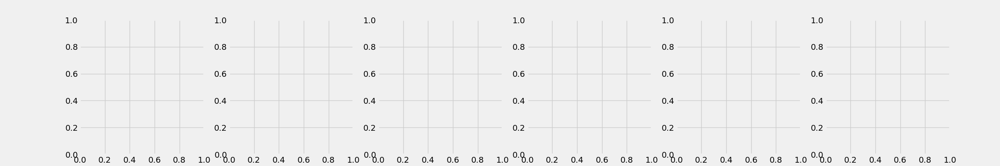

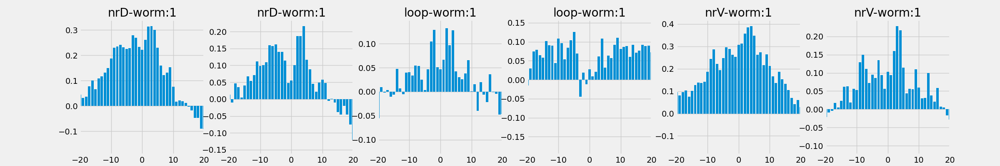

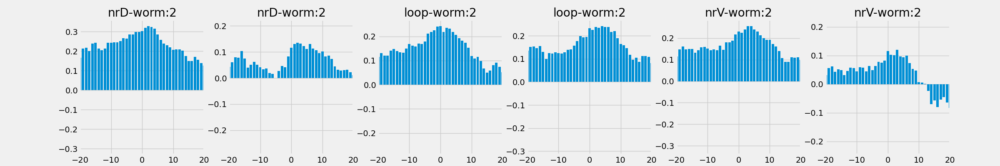

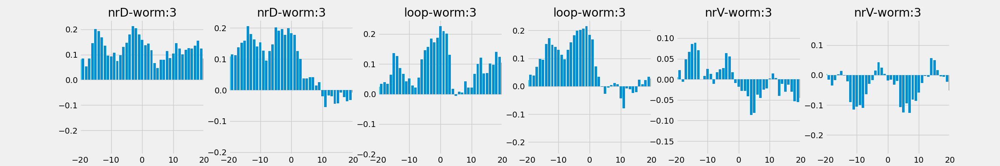

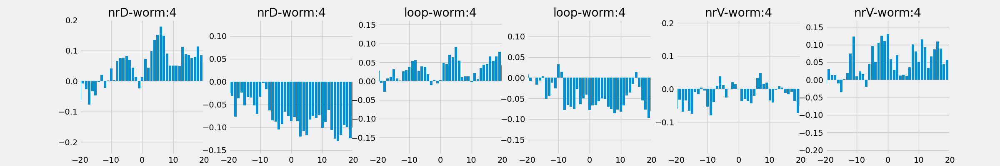

In [36]:
plot_crosscorrelation(Cross_corr_neuronsRI_ind,b,limits=20,n_title=['nrD','nrD','loop','loop','nrV','nrV'])

# Plot the activity aligned at the start of behavior
Thresholding acceleration, speed and angular velocity

In [53]:
m=3
b = [int(32*m),int(50*m),int(50*m),int(50*m),int(47*m),int(53*m),int(54*m)]

In [54]:
acc_thresh = [10,5,5,6,8]
speed_thresh = [10,10,10,10,8]
accthresh_vec= np.zeros((5,8100))
speedthresh_vec= np.zeros((5,8100))
angSpthresh_vec= np.zeros((5,8100))
for d in range(5):
    accthresh_vec[d,:] = MegaData[d,:,48] > acc_thresh[d]
    speedthresh_vec[d,:] = MegaData[d,:,15] > speed_thresh[d]
    angSpthresh_vec[d,:] = MegaData[d,:,46] > 30


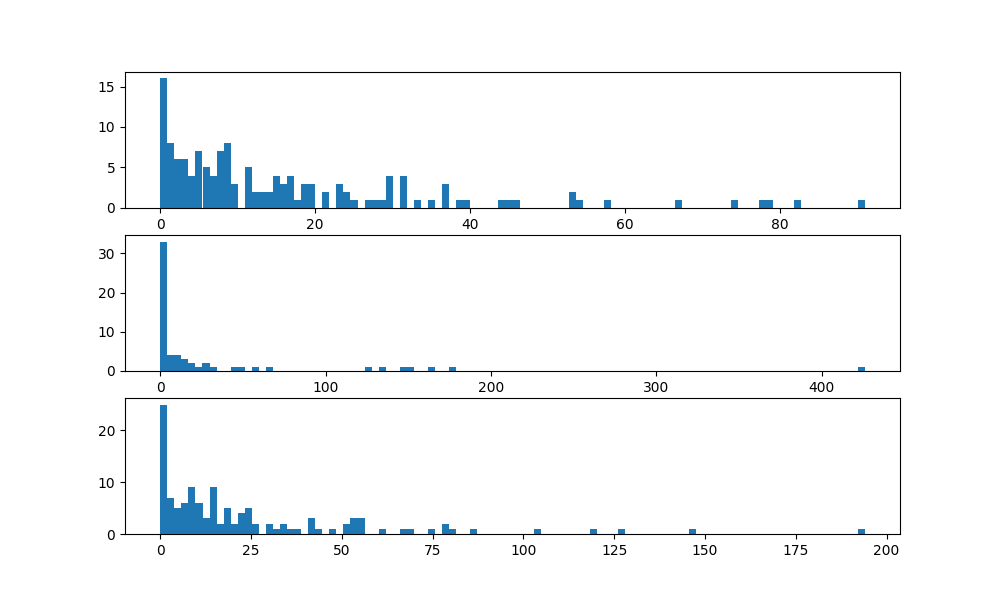

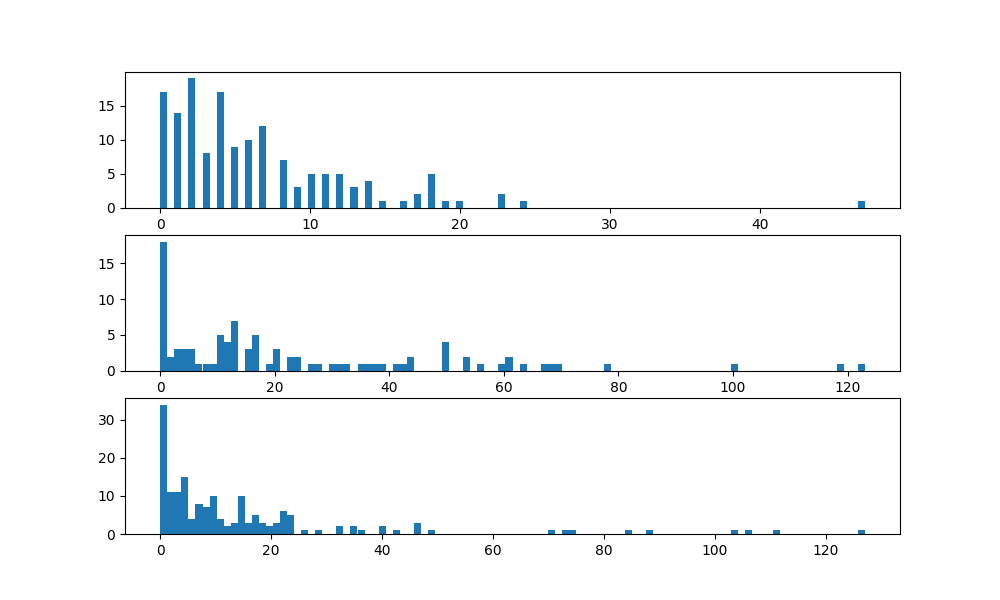

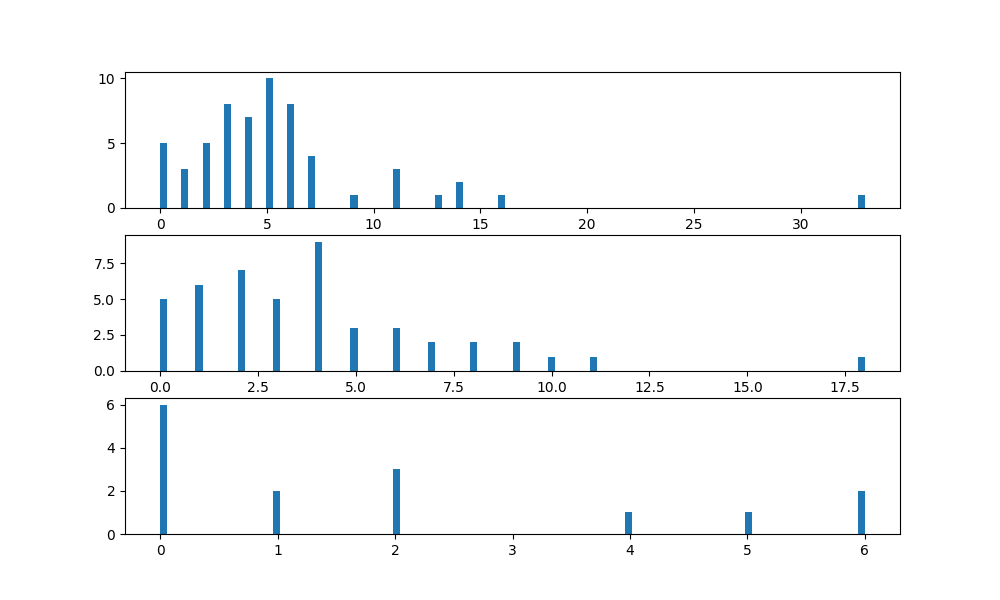

In [55]:
fig,ax = plt.subplots(3,1,figsize=(10,6))
for a in range(1,4):
    X,Y = AllF.get_nonzero_start_end(accthresh_vec[a,:])
    tempLength = [int(Y[i]-X[i]) for i in range(len(X))]
    ax[a-1].hist(tempLength,bins=100)
plt.show()
thresh = [3,4,4]
fig,ax = plt.subplots(3,1,figsize=(10,6))
for a in range(1,4):
    X,Y = AllF.get_nonzero_start_end(speedthresh_vec[a,:])
    tempLength = [int(Y[i]-X[i]) for i in range(len(X))]
    ax[a-1].hist(tempLength,bins=100)
plt.show()
thresh = [3,4,4]
fig,ax = plt.subplots(3,1,figsize=(10,6))
for a in range(1,4):
    X,Y = AllF.get_nonzero_start_end(angSpthresh_vec[a,:])
    tempLength = [int(Y[i]-X[i]) for i in range(len(X))]
    ax[a-1].hist(tempLength,bins=100)
plt.show()
thresh = [3,4,4]

In [56]:
acc_thresh = [10,5,5,6,8]
speed_thresh = [10,10,10,10,8]
accthresh_vecb= np.zeros((5,np.max(b)))
speedthresh_vecb= np.zeros((5,np.max(b)))
angSpthresh_vecb= np.zeros((5,np.max(b)))
for d in range(5):
    accthresh_vecb[d,:] = acceleration_bins[d,:] > acc_thresh[d]
    speedthresh_vecb[d,:] = speed_bins[d,:] > speed_thresh[d]
    angSpthresh_vecb[d,:] = acceleration_bins[d,:] > 30


NameError: name 'acceleration_bins' is not defined

In [ ]:
fig,ax = plt.subplots(3,1,figsize=(10,6))
for a in range(1,4):
    X,Y = AllF.get_nonzero_start_end(accthresh_vecb[a,:])
    tempLength = [int(Y[i]-X[i]) for i in range(len(X))]
    ax[a-1].hist(tempLength,bins=100)
plt.show()
thresh = [3,4,4]
fig,ax = plt.subplots(3,1,figsize=(10,6))
for a in range(1,4):
    X,Y = AllF.get_nonzero_start_end(speedthresh_vecb[a,:])
    tempLength = [int(Y[i]-X[i]) for i in range(len(X))]
    ax[a-1].hist(tempLength,bins=100)
plt.show()
thresh = [3,4,4]
fig,ax = plt.subplots(3,1,figsize=(10,6))
for a in range(1,4):
    X,Y = AllF.get_nonzero_start_end(angSpthresh_vecb[a,:])
    tempLength = [int(Y[i]-X[i]) for i in range(len(X))]
    ax[a-1].hist(tempLength,bins=100)
plt.show()
thresh = [3,4,4]

## Velocity and neuronal Avtivity

In [51]:
m=3
b = [int(32*m),int(50*m),int(50*m),int(50*m),int(47*m),int(53*m),int(54*m)]


1
1
[   0    1    2 ... 4294 4295 4296]


NameError: name 'acceleration_bins' is not defined

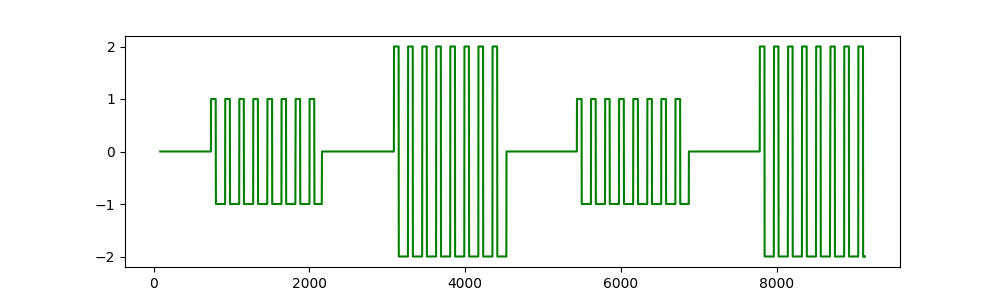

In [52]:

%matplotlib widget
coeff = [50,15,50,0.1,0.5]
VI=16#velocity of interest
Act_shift = 0#shifting activity in seconds to see the predictability power
n=4
n2=2
timeline=11
for d in range(1,4):
    print(d)
    if True:
        fig = plt.figure(figsize=(10,3))
        ax = fig.add_subplot() 
        rowsArr_float = np.copy(MegaData[d,:L[d],:])
        ax.plot(MegaData[d,:L[d],timeline],MegaData[d,:L[d],10],c='g')#plot odor pulses
        print(d)
        VarInteres= np.copy(rowsArr_float[:L[d],VI])
        nonzVI=np.nonzero(VarInteres)[0]
        print(nonzVI)
        df2,mean_time_by_bin, mean_vel_by_bin,width = Bin.bin_and_plot(MegaData[d,nonzVI,timeline],VarInteres[nonzVI],bins=int(b[d]))
        #ax.bar(mean_time_by_bin, mean_vel_by_bin, width=width, align='center',edgecolor='white',color='red')#-backward_bins[d,:b[d]]
        ax.bar(mean_time_by_bin, acceleration_bins[d,:b[d]], width=width, align='center',edgecolor='white',color='red')
        #ax.scatter(MegaData[d,nonzVI,timeline],VarInteres[nonzVI],alpha=0.6,color='orange')
        NeuroNonz = np.nonzero(MegaData[d,:,n])[0]
        ax.scatter(MegaData[d,NeuroNonz,timeline],MegaData[d,NeuroNonz,n]*10,alpha=0.6)
        #accNonz = np.nonzero(MegaData[d,:,48])[0]
        #ax.scatter(MegaData[d,accNonz,timeline],MegaData[d,accNonz,48],alpha=0.6)
        #NeuroNonz = np.nonzero(MegaData[d,:,n2])[0]
        #ax.scatter(MegaData[d,NeuroNonz,timeline],MegaData[d,NeuroNonz,n2]*20,alpha=0.6,color='black')
        ax.set_title('worm---'+str(d))  
        #ax.set_xlim(right=800)
        #ax.set_xlim(left=00)
        plt.show()

## Forward/Backward and neuronal Avtivity

1
1


NameError: name 'forward_bins' is not defined

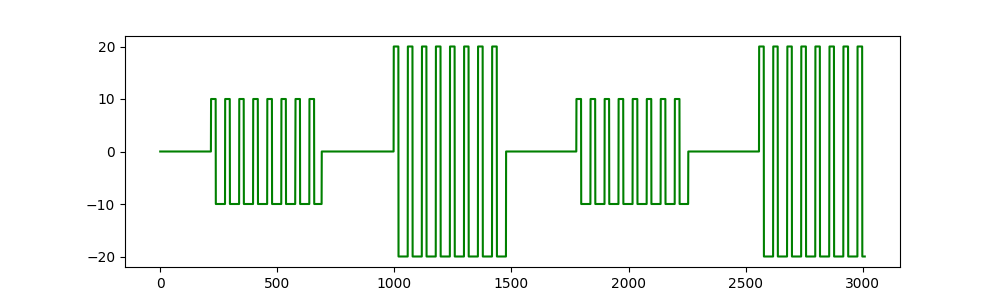

In [59]:

%matplotlib widget
VI=42#velocity of interest
Act_shift = 0#shifting activity in seconds to see the predictability power
n=3
timeline=12
for d in range(1,4):
    print(d)
    if True:
        fig = plt.figure(figsize=(10,3))
        ax = fig.add_subplot() 
        rowsArr_float = np.copy(MegaData[d,:L[d],:])
        ax.plot(MegaData[d,:L[d],timeline],MegaData[d,:L[d],10]*10,c='g')#plot odor pulses
        print(d)
        VarInteres= np.copy(rowsArr_float[:L[d],VI])
        nonzVI=np.nonzero(VarInteres)[0]
        ax.bar(mean_time_by_bin, forward_bins[d,:b[d]]*10, width=width, align='center',edgecolor='white',color='red')
        ax.bar(mean_time_by_bin, -backward_bins[d,:b[d]]*10, width=width, align='center',edgecolor='white',color='green')
        #ax.scatter(MegaData[d,nonzVI,12],VarInteres[nonzVI],alpha=0.6)
        NeuroNonz = np.nonzero(MegaData[d,:,n])[0]
        ax.scatter(MegaData[d,NeuroNonz,timeline],MegaData[d,NeuroNonz,n]*10,alpha=0.6)
        ax.set_title('worm---'+str(d))  
        #ax.set_xlim(right=800)
        #ax.set_xlim(left=00)
        plt.show()

In [16]:
sp = np.nanmean(speed_bins,axis=1)
speed_thresh =[np.float(x) for x in sp ]
#speed_thresh[4]=0.056
print(speed_thresh)

[14.494735523015873, 5.656100861463722, 26.999391395924434, 31.00132356632938, 0.04556088383259474]


[0.48477324 0.14133734 0.12115386]
highest neuron coefficients
[8 3 5 7 2 6 0 1 4]
[7 8 1 4 0 3 5 6 2]


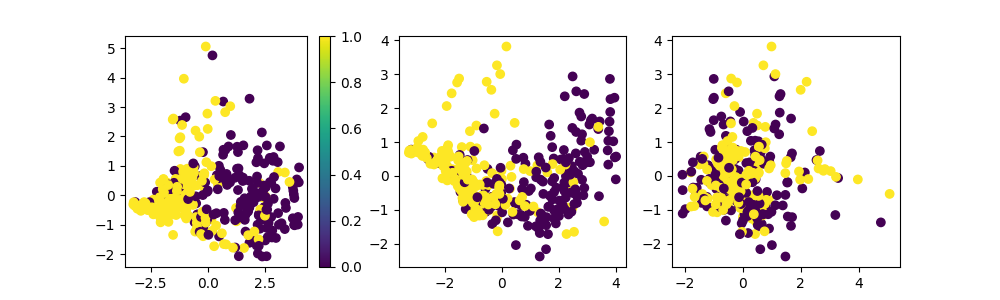

[0.38168723 0.22057596 0.11654684]
highest neuron coefficients
[6 1 8 7 0 3 5 4 2]
[7 0 4 5 8 6 1 2 3]


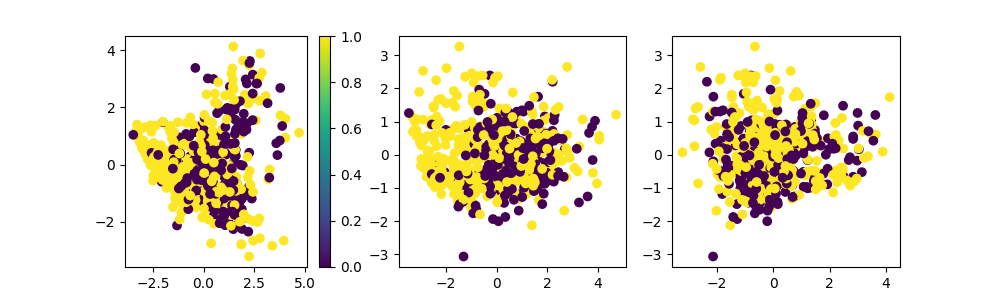

[0.39846236 0.2136369  0.12665796]
highest neuron coefficients
[5 3 4 2 1 6 7 8 0]
[3 2 5 4 6 7 8 0 1]


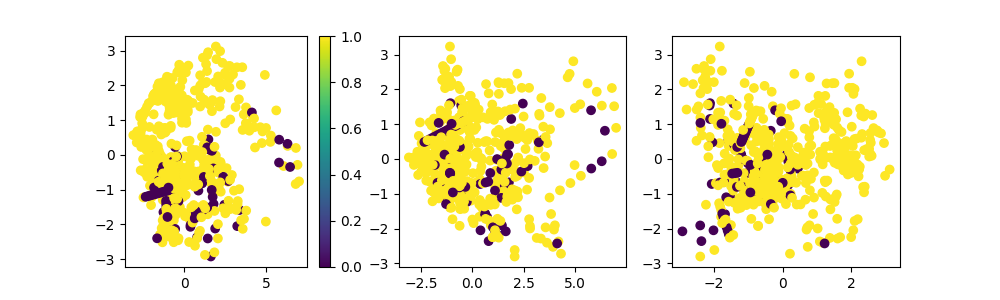

[0.37998285 0.19166061 0.13248023]
highest neuron coefficients
[3 2 8 0 7 6 1 5 4]
[1 5 4 6 8 7 0 2 3]


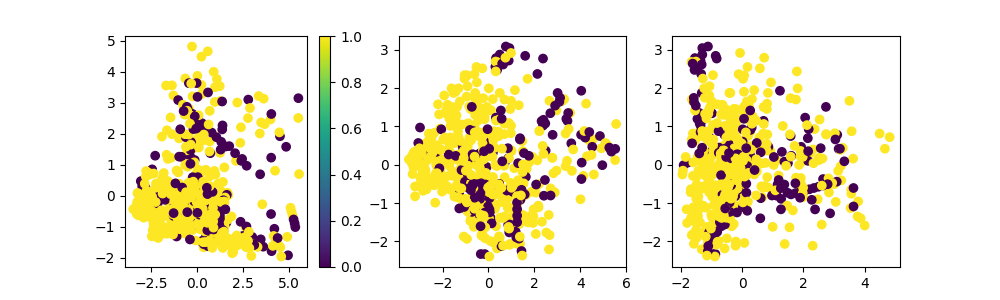

[0.29436438 0.22485755 0.11464899]
highest neuron coefficients
[2 3 8 0 7 1 6 5 4]
[1 0 8 4 7 6 5 2 3]


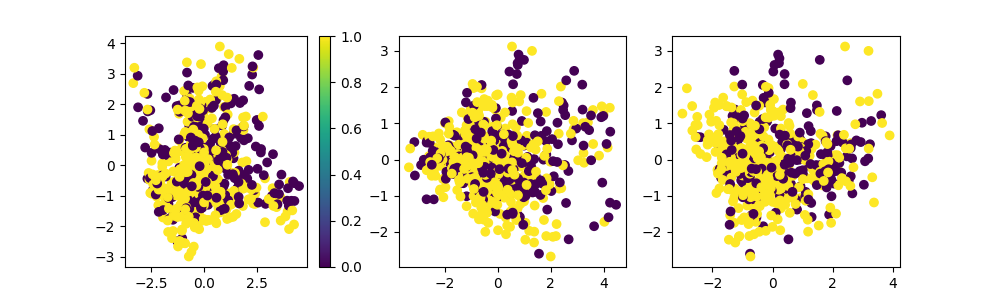

In [17]:
#plot pca of activity bins
for d in range(5):
    pca = PCA(n_components=3)
    
    data_3d = pca.fit_transform((activity_bins[d,:,:b[d]]).transpose())
    pca_bins[d,0,:b[d]] = data_3d[:, 0]
    pca_bins[d,1,:b[d]]  = data_3d[:, 1]
    pca_bins[d,2,:b[d]]  = data_3d[:, 2]
    print(pca.explained_variance_ratio_)
    #print(np.shape(pca.components_))
    
    pca_vec[d,0,:] = pca.components_[0,:]
    pca_vec[d,1,:] = pca.components_[1,:]
    pca_vec[d,2,:] = pca.components_[2,:]
    print("highest neuron coefficients")
    print(np.argsort(pca_vec[d,0,:]))
    print(np.argsort(pca_vec[d,1,:]))
    color = backward_bins[d,:b[d]]>np.mean(backward_bins[d,:b[d]])
    colorOdor = odor_bins[d,:b[d]]>0.5
    ColorSpeed = speed_bins[d,:b[d]]<speed_thresh[d]
    plot_2D_with_color(pca_bins[d,0,:b[d]], pca_bins[d,1,:b[d]], pca_bins[d,2,:b[d]],ColorSpeed)

In [46]:
#by defining color as the proper criteria like odor, turn, back and forth get different clouds
color = theta_bin[d,:b[d]]>5
color = speed_bins[d,:b[d]]<speed_thresh[d]
print(np.nonzero(color-1)[0])
print(np.nonzero(color)[0])

[ 0  4  5  6  7  8  9 10 11 12 14 15 26 28 29 31 32 33 34 36 37 38 39 40
 41 43 44 46 48 49 50 51 54 56 58 60 61 62 73 76 78 86 87 94 95 96]
[ 1  2  3 13 16 17 18 19 20 21 22 23 24 25 27 30 35 42 45 47 52 53 55 57
 59 63 64 65 66 67 68 69 70 71 72 74 75 77 79 80 81 82 83 84 85 88 89 90
 91 92 93 97 98 99]


## Plot neurite activity during odor application

In [73]:
start

[605,
 727,
 848,
 969,
 1090,
 1211,
 1332,
 1453,
 1574,
 2180,
 2301,
 2422,
 2543,
 2664,
 2785,
 2906,
 3027,
 3875,
 3996,
 4117,
 4238,
 4359,
 4481,
 4602,
 5328,
 5449,
 5570,
 5692,
 5813,
 5934,
 6055,
 6176]

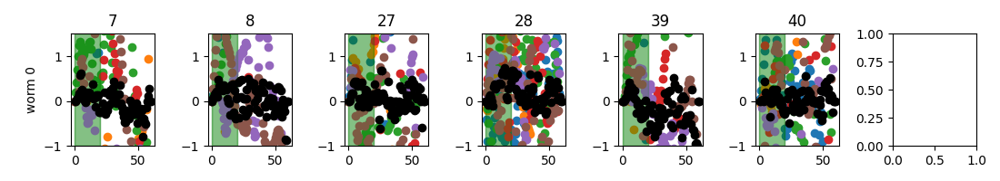

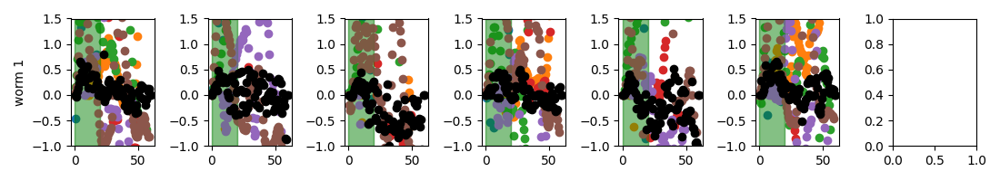

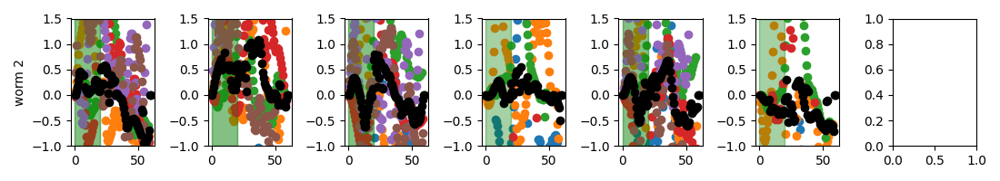

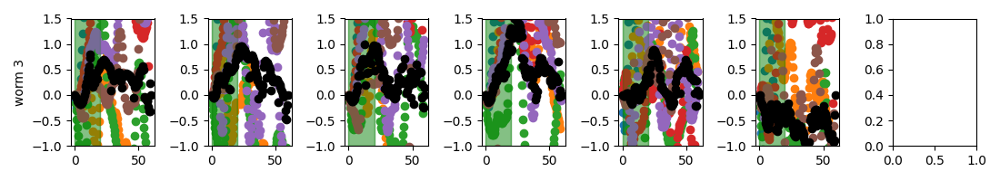

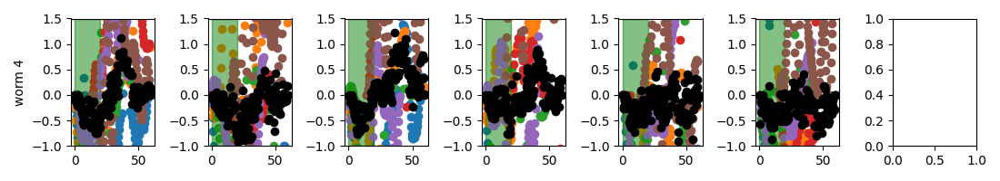

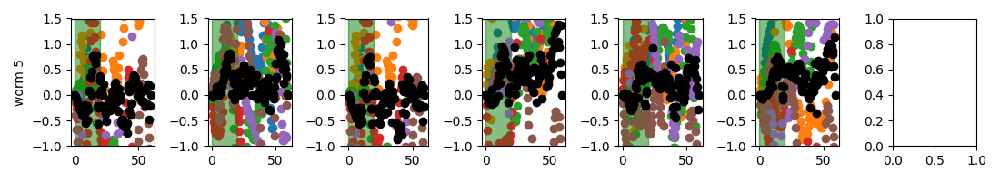

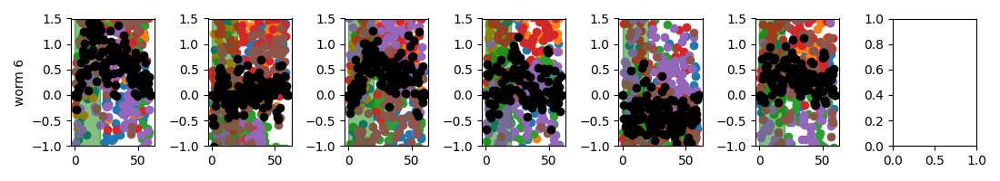

In [74]:
neurons=[7,8,27,28,39,40]
o0=0
of=6
for d in range(7):
    rowsArr_float = np.copy(MegaData[d,:L[d],:])
    start,end = AllF.get_nonzero_start_end(MegaData[d,:L[d],10])
    fig,ax = plt.subplots(1,7,figsize=(11,2))
    num_time_pts = start[1]-start[0]#make the number of timepoint bigger for the data_odor matrix
    data_odor = np.zeros((8,num_time_pts,len(neurons)))
    ax[0].set_ylabel('worm '+str(d))  
    
    for o in range(o0,of):# number of odor pulses
        count=0#neurons count
        for n in neurons:
            activity = AllF.compute_vector_z_score(rowsArr_float[start[o]:(start[o+1]-2),n])
            nonz = np.nonzero(activity)[0]
            if d==0:
                ax[count].set_title(str(n))
            if len(nonz)>2:
                time = rowsArr_float[start[o]:(start[o+1]-2),12]
                activity[nonz] = activity[nonz] - activity[nonz[0]]
                data_odor[o-o0,:len(time),count]= activity
                ax[count].scatter(time[nonz]-time[0],activity[nonz])#,c='blue')
                ax[count].axvspan(0,20,color='green',alpha=0.1)
                ax[count].set_ylim(-1,1.5)
            count=count+1    
      
    mean_odor = np.nanmean(data_odor,axis=0)
    count=0#neurons count
    for n in neurons:
        ax[count].scatter(rowsArr_float[:num_time_pts,12],mean_odor[:,count],color='black')#,lw=4)#,c='blue')
        count=count+1
    plt.tight_layout()  
    plt.show()

## List of indices

0 RIA,1 RIA,2 RIM,3 RIM,4 RIB,5 RIB,6sensory,7neurite term1 ,8 neurite term2, 9 neuron or neurite sum,

10 odor,11uppercamera_index,12lower_camera_time_stamp,13v_center_long,
13v_center_long,

14v_center_signed_long,15v_center_medium,16v_center_signed_medium,17v_center_short,18v_center_signed_short,
19v_head_long,20v_tail,

21 theta, 22 v_headsigned_long, 23 v_headsigned_medium, 24 v_head_short,25 v_head_medium, 26:head curvature

29:head perpandicular_short, 30:head perpandicular_medium, 31:head perpandicular_long, 32:tail velocity perpendicular long, 33:tail velocity_medium, 34:tail velocity_short, 35: tail curvature, 36: merged neurites